# INTERNSHIP PROJECT

# INNOMATICS RESEARCH LAB

# TASK 2 - DATA ANALYSIS

# Import Libraries

In [114]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

# Reading the data

In [62]:
train = pd.read_csv("aspiring_minds_employability_outcomes_2015.csv")

# Number of rows and columns

In [63]:
train.shape

(3998, 39)

# See the first five records

In [64]:
train.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,f,19-02-1990 00:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,m,04-10-1989 00:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,f,03-08-1992 00:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,01-07-2011 00:00,present,senior software engineer,Gurgaon,m,05-12-1989 00:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,m,27-02-1991 00:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


# Number of unique levels

In [65]:
train.nunique()

Unnamed: 0                  1
ID                       3998
Salary                    177
DOJ                        81
DOL                        67
Designation               419
JobCity                   339
Gender                      2
DOB                      1872
10percentage              851
10board                   275
12graduation               16
12percentage              801
12board                   340
CollegeID                1350
CollegeTier                 2
Degree                      4
Specialization             46
collegeGPA               1282
CollegeCityID            1350
CollegeCityTier             2
CollegeState               26
GraduationYear             11
English                   111
Logical                   107
Quant                     138
Domain                    243
ComputerProgramming        79
ElectronicsAndSemicon      29
ComputerScience            20
MechanicalEngg             42
ElectricalEngg             31
TelecomEngg                26
CivilEngg 

# Understanding high level details about data

# Missing values

In [66]:
train.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

## There are no missing values in the data

# Data types of attributes

In [67]:
train.dtypes

Unnamed: 0                object
ID                         int64
Salary                   float64
DOJ                       object
DOL                       object
Designation               object
JobCity                   object
Gender                    object
DOB                       object
10percentage             float64
10board                   object
12graduation               int64
12percentage             float64
12board                   object
CollegeID                  int64
CollegeTier                int64
Degree                    object
Specialization            object
collegeGPA               float64
CollegeCityID              int64
CollegeCityTier            int64
CollegeState              object
GraduationYear             int64
English                    int64
Logical                    int64
Quant                      int64
Domain                   float64
ComputerProgramming        int64
ElectronicsAndSemicon      int64
ComputerScience            int64
Mechanical

# Summary of data

In [68]:
train.describe(include='all')

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3998,3.998000e+03,3.998000e+03,3998,3998,3998,3998,3998,3998,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
unique,1,NaN,NaN,81,67,419,339,2,1872,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,train,NaN,NaN,01-07-2014 00:00,present,software engineer,Bangalore,m,01-01-1991 00:00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3998,NaN,NaN,199,1875,539,627,3041,11,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,6.637945e+05,3.076998e+05,NaN,NaN,NaN,NaN,NaN,NaN,77.925443,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,NaN,3.632182e+05,2.127375e+05,NaN,NaN,NaN,NaN,NaN,NaN,9.850162,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,NaN,1.124400e+04,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,43.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,NaN,3.342842e+05,1.800000e+05,NaN,NaN,NaN,NaN,NaN,NaN,71.680000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,NaN,6.396000e+05,3.000000e+05,NaN,NaN,NaN,NaN,NaN,NaN,79.150000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,NaN,9.904800e+05,3.700000e+05,NaN,NaN,NaN,NaN,NaN,NaN,85.670000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400


# Exploratory Data analysis

# Some Important Visualisations

## '10'nth percentage attribute

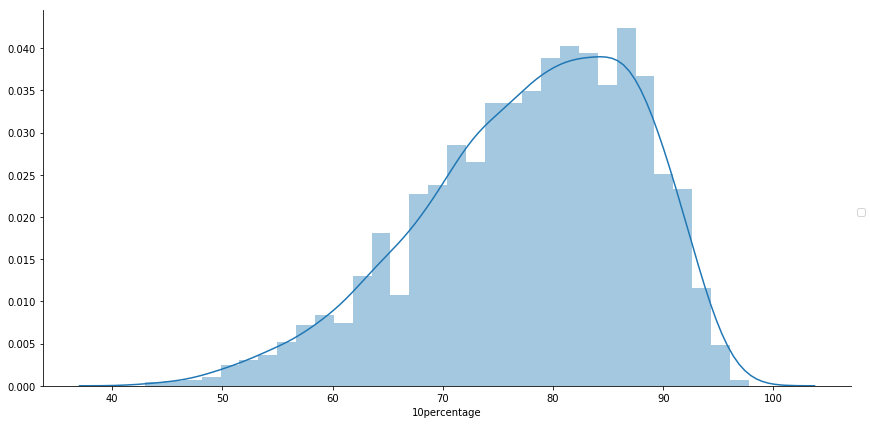

In [118]:
sns.FacetGrid(data=train,size=6,aspect=2).map(sns.distplot,"10percentage").add_legend()

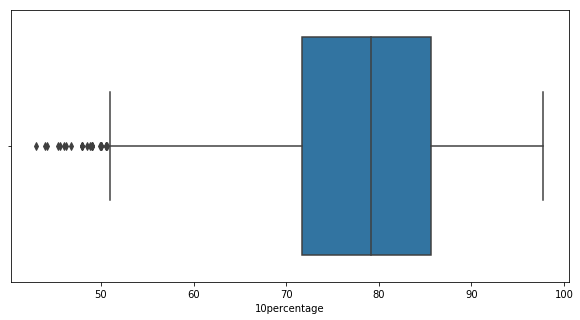

In [70]:
plt.figure(figsize=(10,5))
sns.boxplot(train['10percentage'])

# Gender attribute

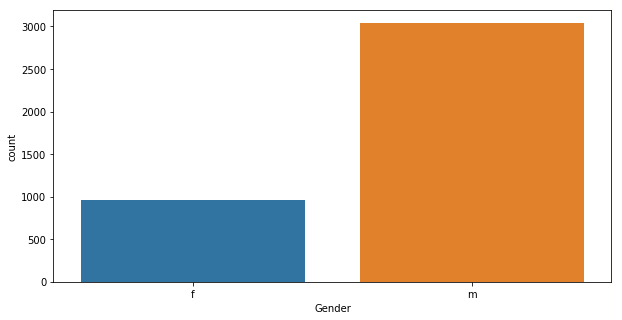

In [71]:
plt.figure(figsize=(10,5))
sns.countplot(train['Gender'])

# '10'nth Board attribute

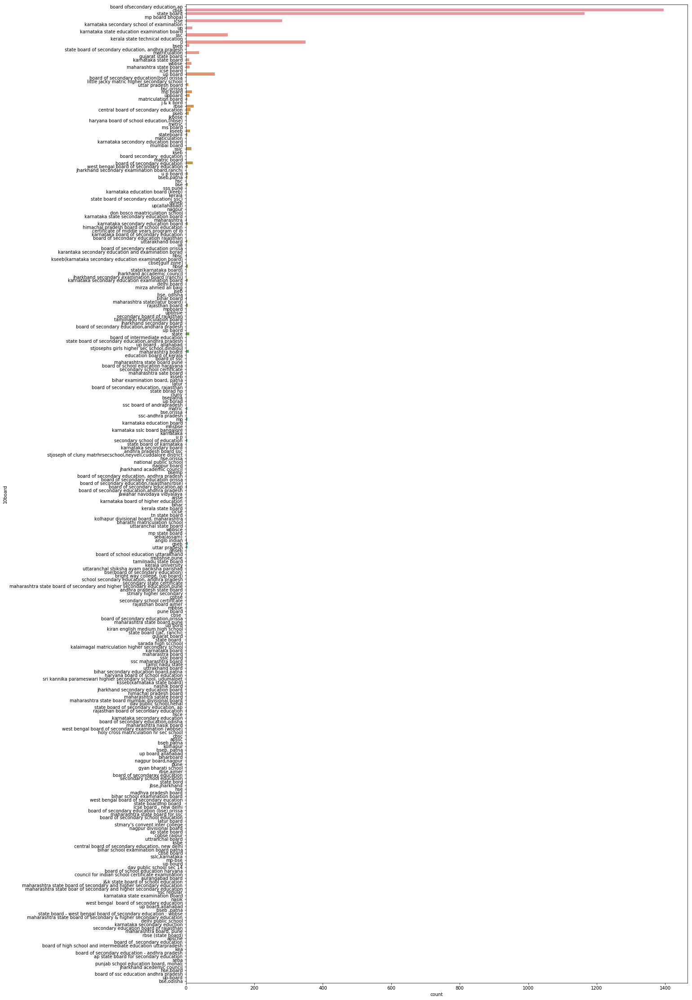

In [72]:
plt.figure(figsize=(20,40))
sns.countplot(y=train['10board'])

In [73]:
train['10board'].unique()

array(['board ofsecondary education,ap', 'cbse', 'state board',
       'mp board bhopal', 'icse',
       'karnataka secondary school of examination', 'up',
       'karnataka state education examination board', 'ssc',
       'kerala state technical education', '0', 'bseb',
       'state board of secondary education, andhra pradesh',
       'matriculation', 'gujarat state board', 'karnataka state board',
       'wbbse', 'maharashtra state board', 'icse board', 'up board',
       'board of secondary education(bse) orissa',
       'little jacky matric higher secondary school',
       'uttar pradesh board', 'bsc,orissa', 'mp board', 'upboard',
       'matriculation board', 'j & k bord', 'rbse',
       'central board of secondary education', 'pseb', 'jkbose',
       'haryana board of school education,(hbse)', 'metric', 'ms board',
       'kseeb', 'stateboard', 'maticulation',
       'karnataka secondory education board', 'mumbai board', 'sslc',
       'kseb', 'board secondary  education', 'm

# Year of 12th graduation attribute

Text(7.19745,0.5,'count')

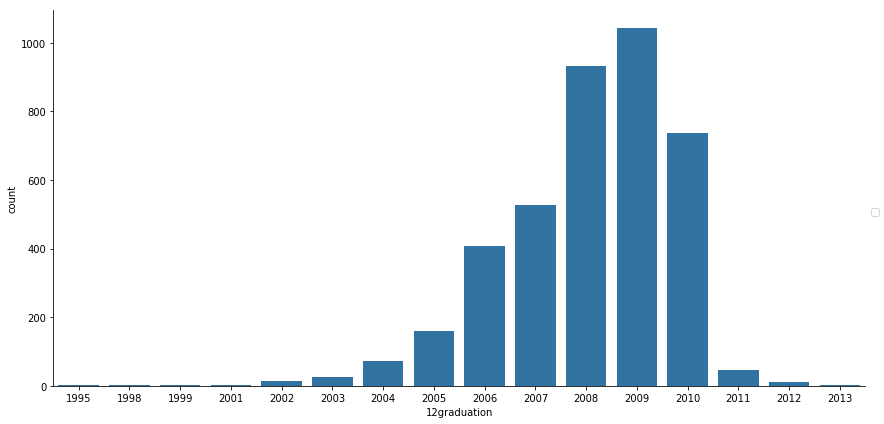

In [119]:
sns.FacetGrid(data=train,size=6,aspect=2).map(sns.countplot,"12graduation").add_legend()
plt.ylabel("count")

# '12'th board attribute

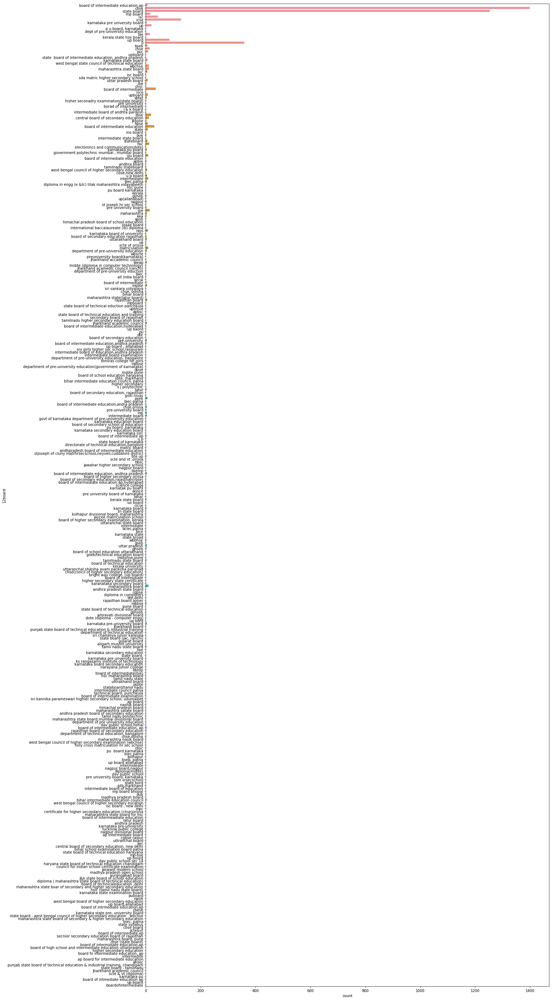

In [75]:
plt.figure(figsize=(20,50))
sns.countplot(y=train['12board'])

In [76]:
print(train['12board'].unique())

['board of intermediate education,ap' 'cbse' 'state board' 'mp board'
 'isc' 'icse' 'karnataka pre university board' 'up' 'p u board, karnataka'
 'dept of pre-university education' 'bie' 'kerala state hse board'
 'up board' '0' 'bseb' 'chse' 'puc' ' upboard'
 'state  board of intermediate education, andhra pradesh'
 'karnataka state board'
 'west bengal state council of technical education' 'wbchse'
 'maharashtra state board' 'ssc' 'isc board'
 'sda matric higher secondary school' 'uttar pradesh board' 'ibe' 'chsc'
 'board of intermediate' 'isce' 'upboard' 'sbtet'
 'hisher seconadry examination(state board)' 'pre university'
 'borad of intermediate' 'j & k board'
 'intermediate board of andhra pardesh' 'rbse'
 'central board of secondary education' 'jkbose' 'hbse'
 'board of intermediate education' 'state' 'ms board' 'pue'
 'intermediate state board' 'stateboard' 'hsc'
 'electonincs and communication(dote)' 'karnataka pu board'
 'government polytechnic mumbai , mumbai board' 'pu board'

# College tier

Text(7.59722,0.5,'count')

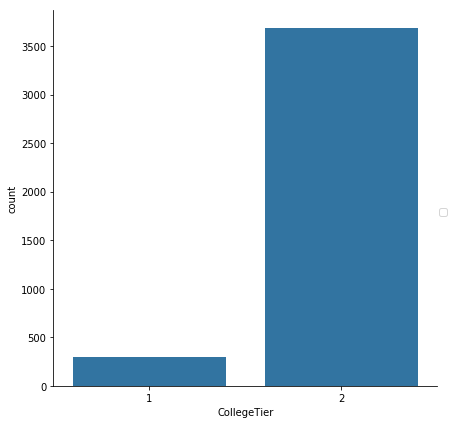

In [120]:
sns.FacetGrid(data=train,size=6).map(sns.countplot,"CollegeTier").add_legend()
plt.ylabel("count")

# Degree attribute

Text(7.19861,0.5,'count')

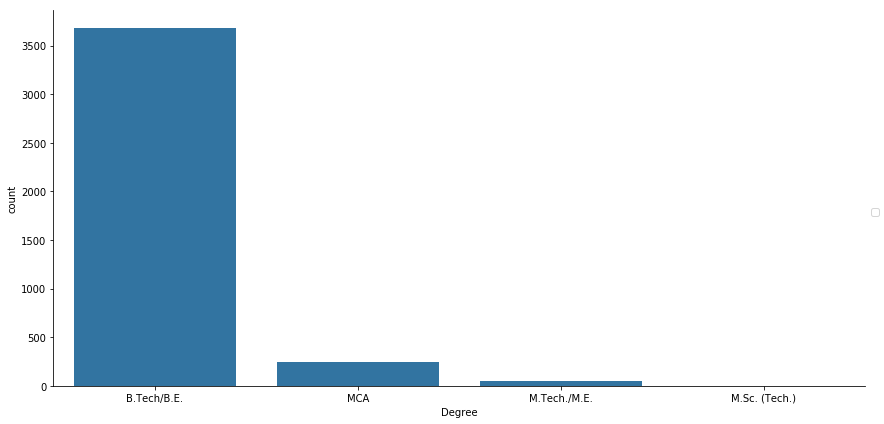

In [121]:
sns.FacetGrid(data=train,size=6,aspect=2).map(sns.countplot,"Degree").add_legend()
plt.ylabel("count")

# Specalization attribute

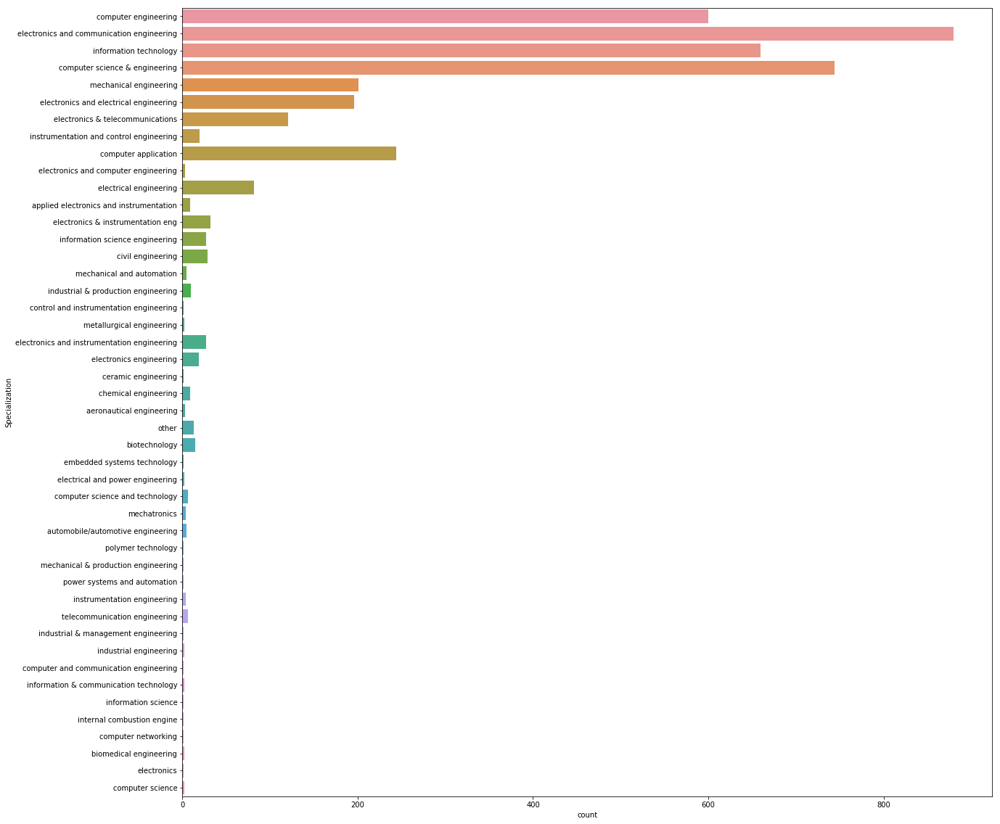

In [79]:
plt.figure(figsize=(20,20))
sns.countplot(y=train['Specialization'])

# Graduation GPA (in percentage) attribute

Text(0.5,20.8,'College GPA in percentage')

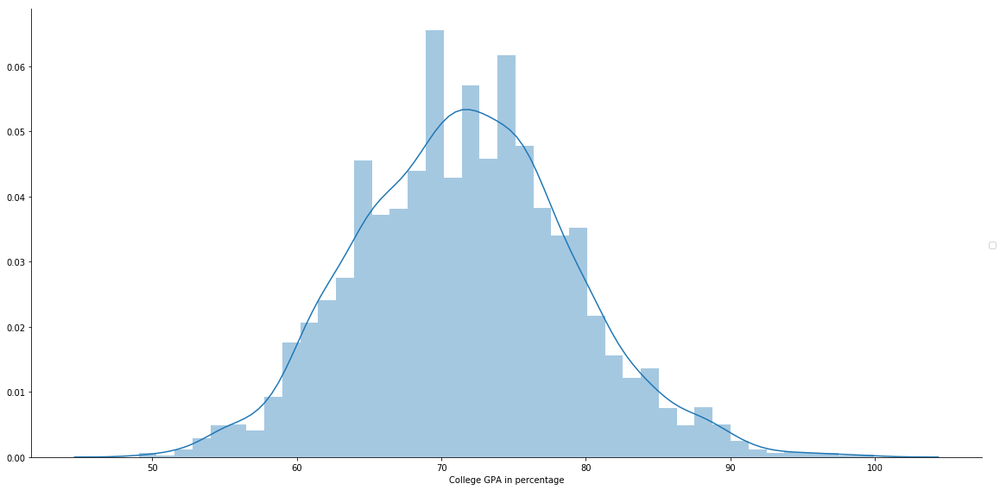

In [122]:
sns.FacetGrid(data=train,size=8,aspect=2).map(sns.distplot,"collegeGPA").add_legend()
plt.xlabel("College GPA in percentage")

# College City Tier attribute

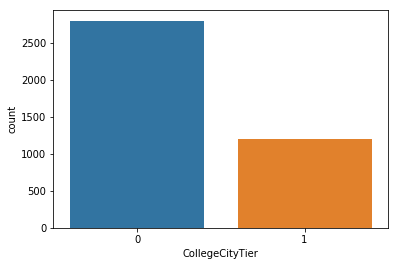

In [81]:
sns.countplot(train['CollegeCityTier'])

# College state

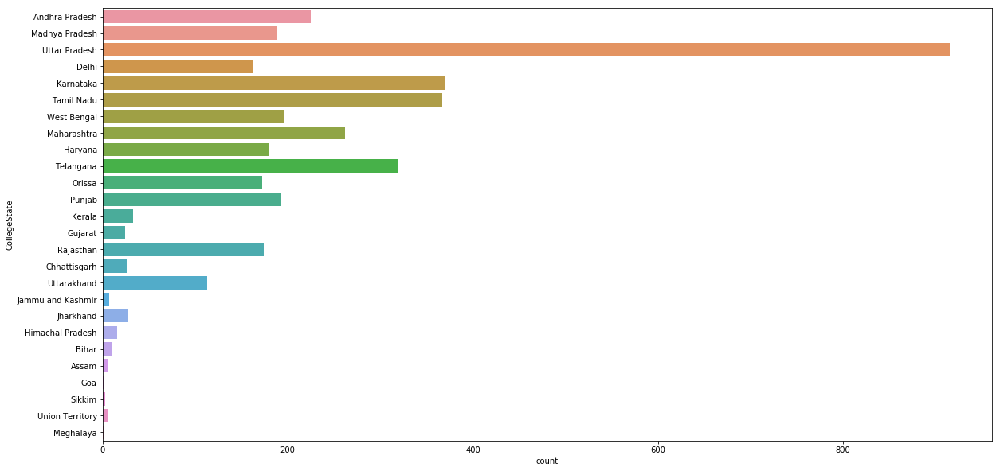

In [82]:
plt.figure(figsize=(20,10))
sns.countplot(y=train['CollegeState'])

# Year of bachelors degree graduation

Text(7.19861,0.5,'count')

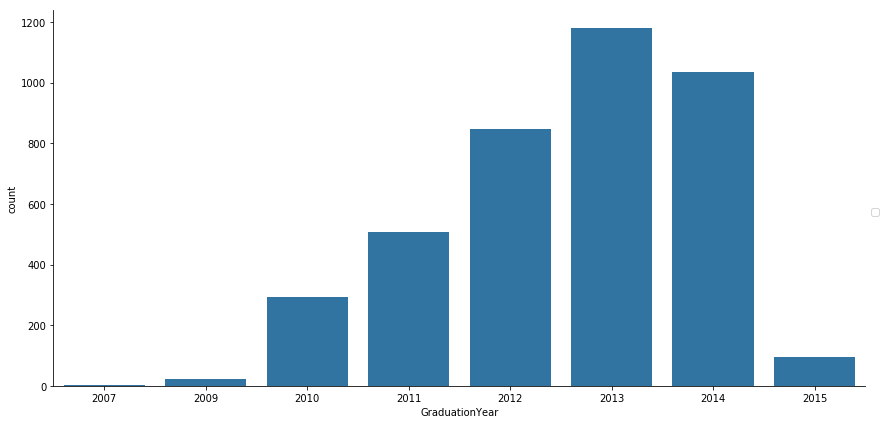

In [123]:
sns.FacetGrid(data=train,size=6,aspect=2).map(sns.countplot,"GraduationYear").add_legend()
plt.ylabel("count")

# Amcat English section score attribute

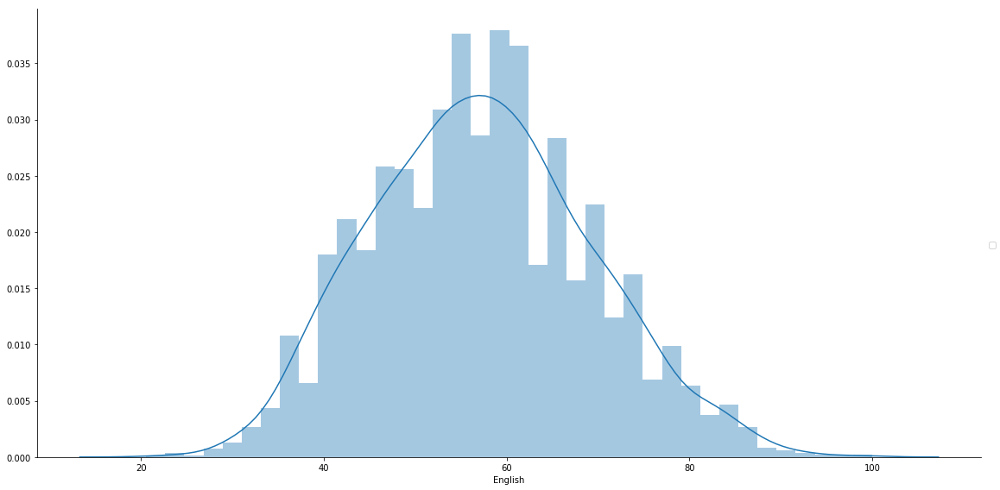

In [124]:
sns.FacetGrid(data=train,size=8,aspect=2).map(sns.distplot,"English").add_legend()

# Amcat Logical ability section score attribute

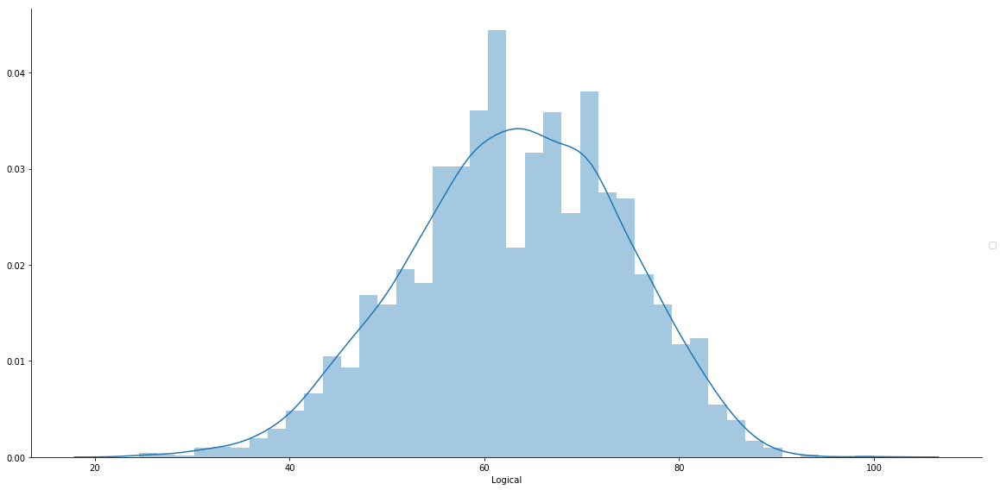

In [125]:
sns.FacetGrid(data=train,size=8,aspect=2).map(sns.distplot,"Logical").add_legend()

# Amcat Quants section score attribute

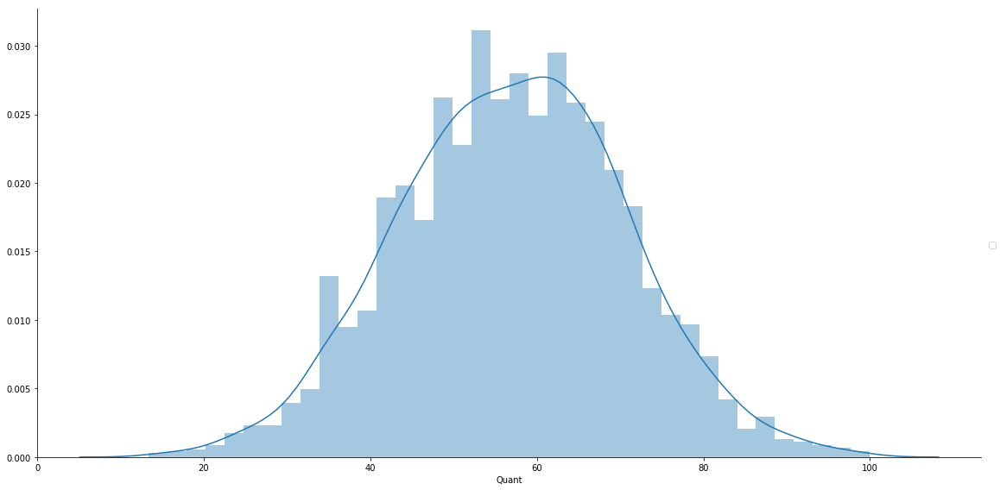

In [126]:
sns.FacetGrid(data=train,size=8,aspect=2).map(sns.distplot,"Quant").add_legend()

# Amcat domain score

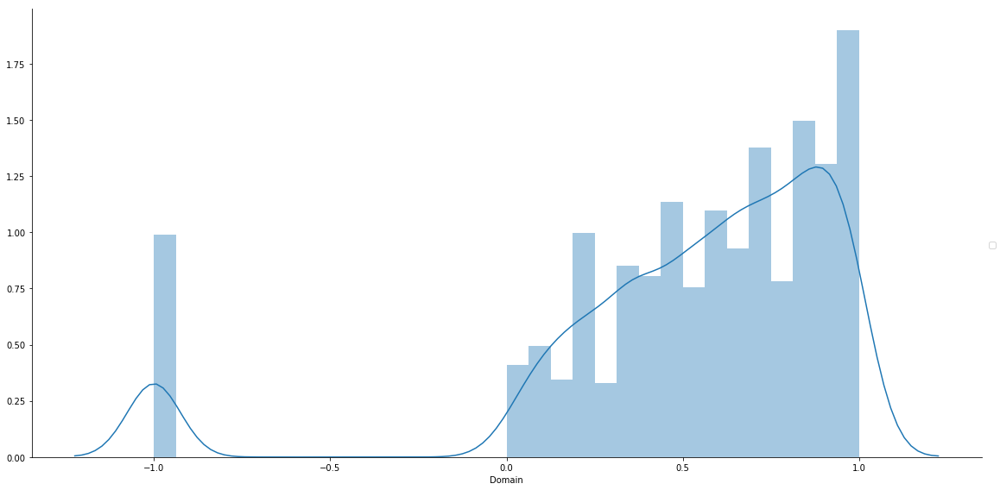

In [127]:
sns.FacetGrid(data=train,size=8,aspect=2).map(sns.distplot,"Domain").add_legend()

# Personality test conscientiousness score attribute

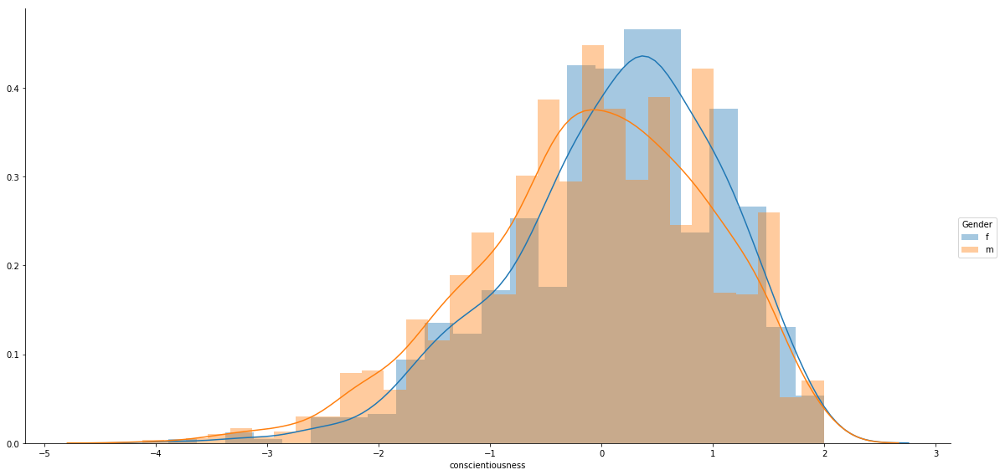

In [128]:
sns.FacetGrid(data=train,hue="Gender",size=8,aspect=2).map(sns.distplot,"conscientiousness").add_legend()

# Personality test agreeableness score attribute

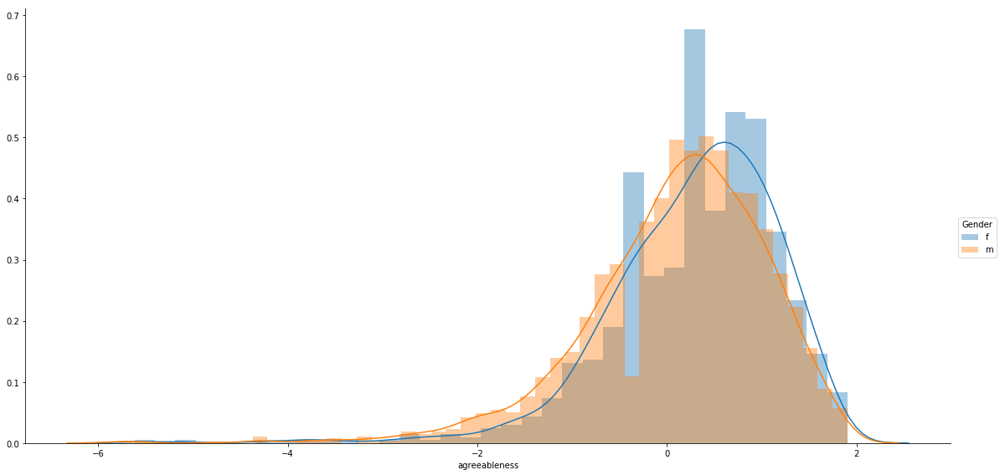

In [129]:
sns.FacetGrid(data=train,hue="Gender",size=8,aspect=2).map(sns.distplot,"agreeableness").add_legend()

# Personality test extraversion score attribute

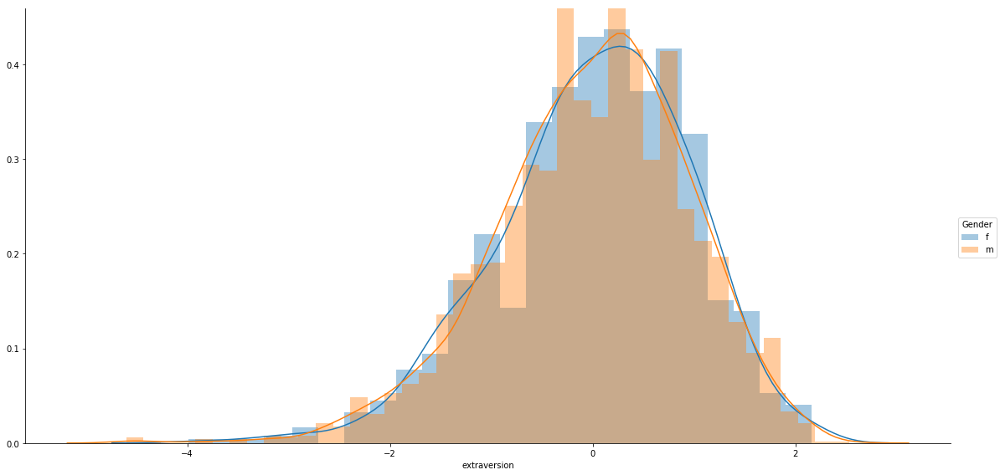

In [117]:
sns.FacetGrid(data=train,hue="Gender",size=8,aspect=2).map(sns.distplot,"extraversion").add_legend()

# Personality test nueroticism score attribute

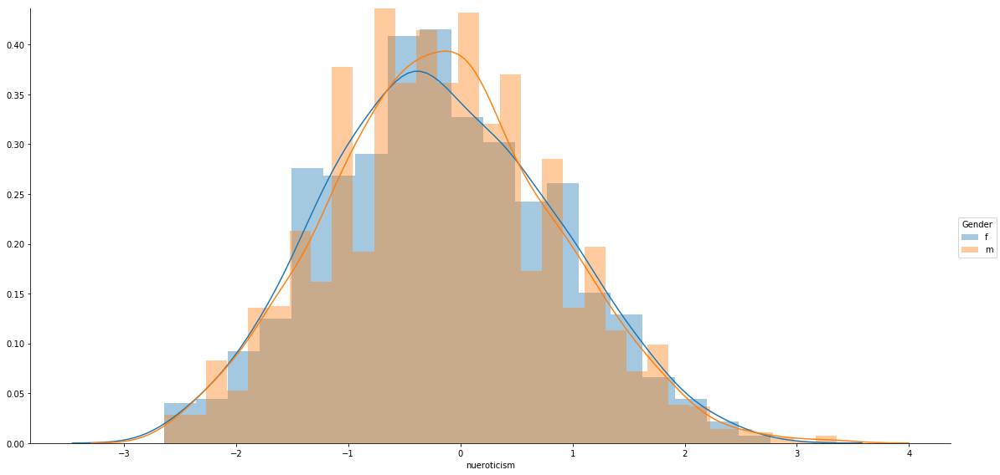

In [116]:
sns.FacetGrid(data=train,hue="Gender",size=8,aspect=2).map(sns.distplot,"nueroticism").add_legend()

# Personality test openess_to_experience score attribute

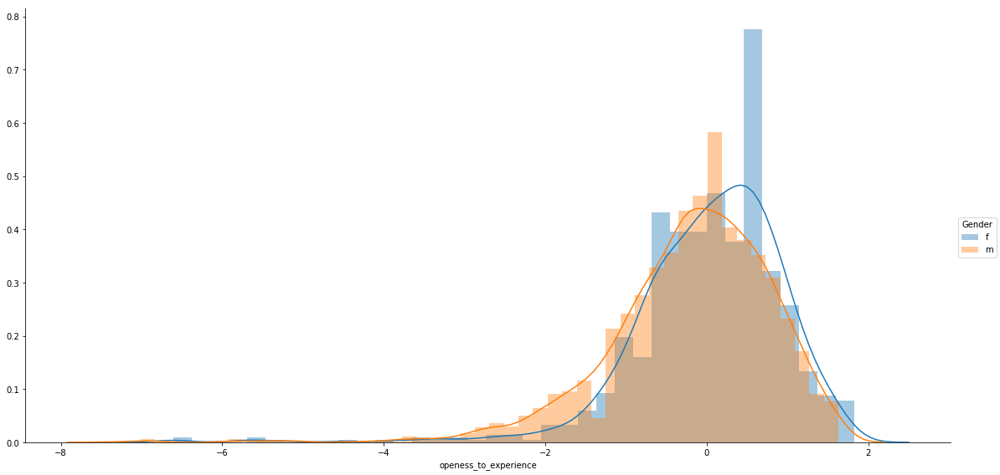

In [115]:
sns.FacetGrid(data=train,hue="Gender",size=8,aspect=2).map(sns.distplot,"openess_to_experience").add_legend()

# Analyzing the target (Salary) Variable by gender

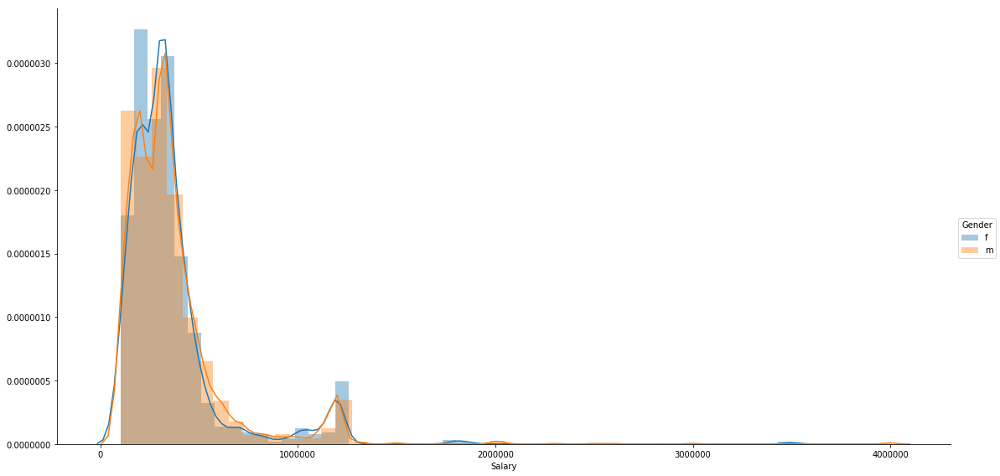

In [130]:
sns.FacetGrid(data=train,hue="Gender",size=8,aspect=2).map(sns.distplot,"Salary").add_legend()

# Pair plot of amcat scores by College Tier

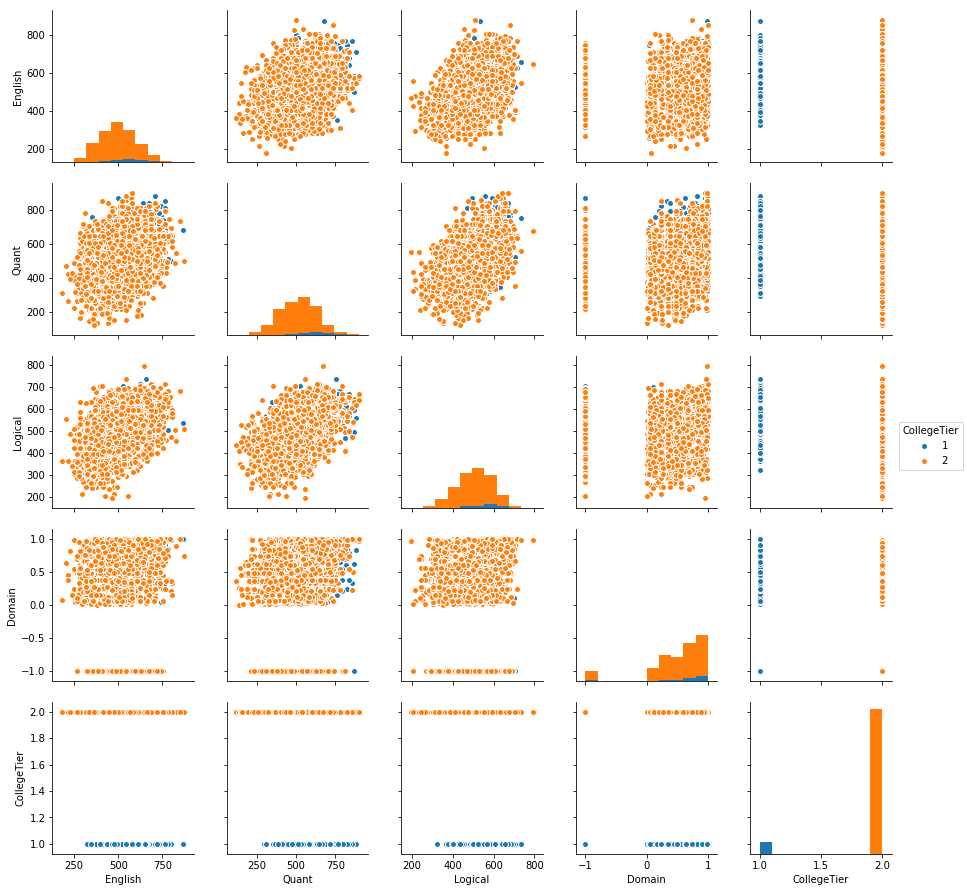

In [94]:
amcatScores = train[['English','Quant','Logical','Domain','CollegeTier']]
sns.pairplot(data=amcatScores,hue="CollegeTier")

# Pair plot of amcat scores by Degree

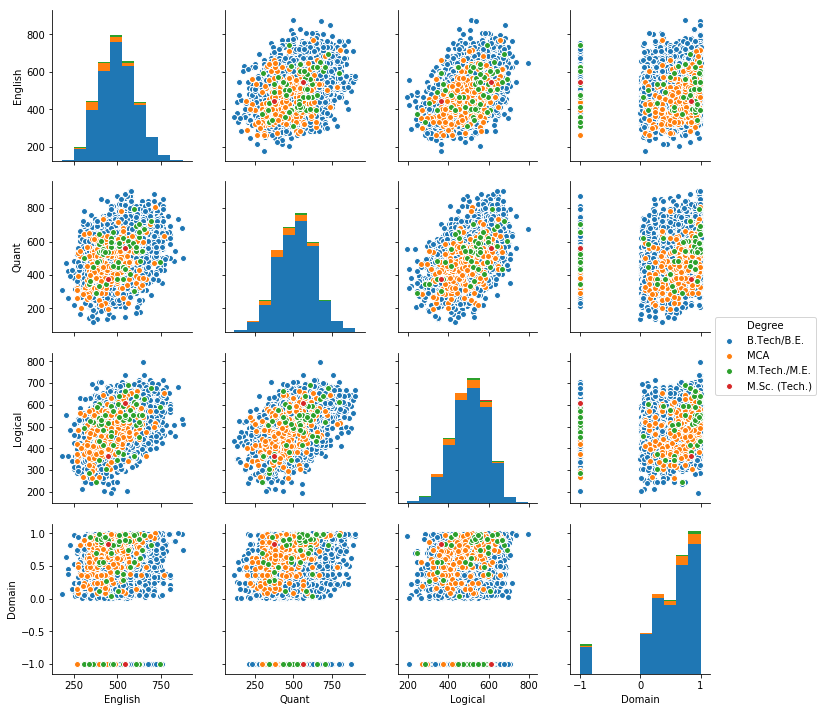

In [95]:
amcatScores1 = train[['English','Quant','Logical','Domain','Degree']]
sns.pairplot(data=amcatScores1,hue="Degree")

# Pair plot of personality scores by Degree

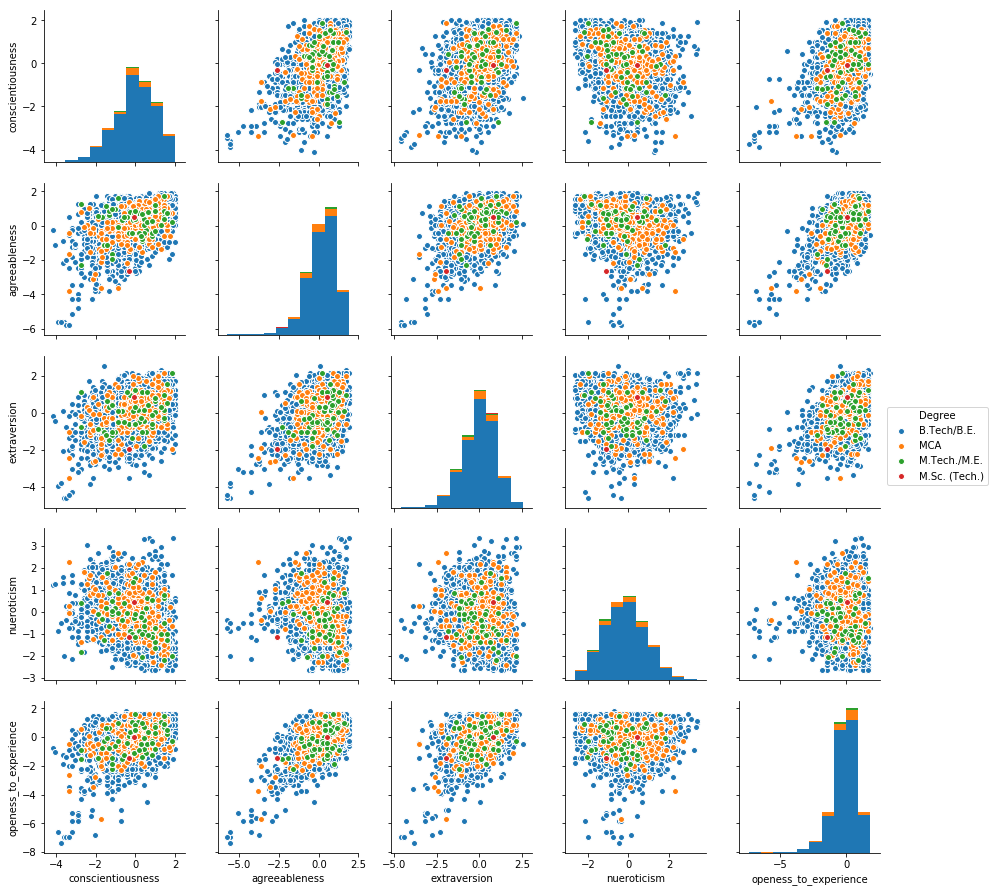

In [96]:
personalityScores = train[['conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience','Degree']]
sns.pairplot(data=personalityScores,hue='Degree')

# Data Pre-Processing

# Uni-Variate and Bi-Variate Analysis

In [97]:
train.iloc[1,3]

'01-09-2013 00:00'

In [98]:
train['JobCity']=train['JobCity'].str.replace('-1','Others')

In [99]:
train['DOL']=train['DOL'].str.replace('present','01-12-2015 00:00')

In [100]:
train.dtypes

Unnamed: 0                object
ID                         int64
Salary                   float64
DOJ                       object
DOL                       object
Designation               object
JobCity                   object
Gender                    object
DOB                       object
10percentage             float64
10board                   object
12graduation               int64
12percentage             float64
12board                   object
CollegeID                  int64
CollegeTier                int64
Degree                    object
Specialization            object
collegeGPA               float64
CollegeCityID              int64
CollegeCityTier            int64
CollegeState              object
GraduationYear             int64
English                    int64
Logical                    int64
Quant                      int64
Domain                   float64
ComputerProgramming        int64
ElectronicsAndSemicon      int64
ComputerScience            int64
Mechanical

In [101]:
train['DOL'] = pd.to_datetime(train['DOL'])
train['DOJ'] = pd.to_datetime(train['DOJ'])
train['DOB'] = pd.to_datetime(train['DOB'])
train['EXP']=train['DOL']-train['DOJ']

In [102]:
train['Age']=train['DOL']-train['DOB']
train['Age']=train['Age'].astype(str)

In [103]:
train['Experience']=((train['DOL']-train['DOJ']).map(lambda x: round(x.days/365,1)))


In [104]:
train.loc[train['collegeGPA']<=10,'collegeGPA']*=9.5

In [105]:
train['Age']=((train['DOL']-train['DOB']).map(lambda x: round(x.days/365)))

In [106]:
train['Age']=train['Age'].astype(int)
train['Experience']=train['Experience'].astype(int)

# Feature Engineering

In [108]:
train.JobCity = train.JobCity.str.replace('banglore','bangalore')
train.JobCity = train.JobCity.str.replace('delhi','new delhi')
train.JobCity = train.JobCity.str.replace('new dehli','new delhi')
train.JobCity = train.JobCity.str.replace('new delhi/ncr','new delhi')
train.JobCity = train.JobCity.str.replace('ncr','new delhi')
train.JobCity = train.JobCity.str.replace('navi mumbai','mumbai')
train.JobCity = train.JobCity.str.replace('mumbai , hyderabad','mumbai')
train.JobCity = train.JobCity.str.replace('new new delhi','new delhi')
train.JobCity = train.JobCity.str.replace('asifabadbangalore','bangalore')
train.JobCity = train.JobCity.str.replace('bengaluru','bangalore')
train.JobCity = train.JobCity.str.replace('greater noida','noida')
train.JobCity = train.JobCity.str.replace('nouda','noida')
train.JobCity = train.JobCity.str.replace('banagalore','bangalore')
train.JobCity = train.JobCity.str.replace('banaglore','bangalore')
train.JobCity = train.JobCity.str.replace('a-64,sec-64,noida','noida')
train.JobCity = train.JobCity.str.replace('technopark, trivandrum','trivandrum')
train.JobCity = train.JobCity.str.replace('vizag','visakhapatnam')
train.JobCity = train.JobCity.str.replace('vsakhapttnam','visakhapatnam')
train.JobCity = train.JobCity.str.replace('thiruvananthapuram','trivandrum')
train.JobCity = train.JobCity.str.replace('ambala city','ambala')
train.JobCity = train.JobCity.str.replace('kudankulam ,tarapur','kundankulam')
train.JobCity = train.JobCity.str.replace('gaziabaad','ghaziabad')
train.JobCity = train.JobCity.str.replace('gajiabaad','ghaziabad')
train.JobCity = train.JobCity.str.replace('bhubaneswar','bhubaneshwar')
train.JobCity = train.JobCity.str.replace('bhubneshwar','bhubaneshwar')
train.JobCity = train.JobCity.str.replace('guragaon','gurgaon')
train.JobCity = train.JobCity.str.replace('gurgoan','gurgaon')
train.JobCity = train.JobCity.str.replace('kolkata`','kolkata')
train.JobCity = train.JobCity.str.replace('sonepat','sonipat')
train.JobCity = train.JobCity.str.replace('baroda','vadodara')
train.JobCity = train.JobCity.str.replace('hderabad','hyderabad')
train.JobCity = train.JobCity.str.replace('pondi','pondy')
train.JobCity = train.JobCity.str.replace('punchkula','panchkula')
train.JobCity = train.JobCity.str.replace('muzzafarpur','muzaffarpur')
train.JobCity = train.JobCity.str.replace('kochi/cochin, chennai and coimbatore','kochi/cochin')
train.JobCity = train.JobCity.str.replace('nasikcity','nashik')
train.JobCity = train.JobCity.str.replace('sahibabad','shahibabad')
train.JobCity = train.JobCity.str.replace('punr','pune')
train.JobCity = train.JobCity.str.replace('tirupati','tirupathi')
train.JobCity = train.JobCity.str.replace('sadulpur,rajgarh,distt-churu,rajasthan','sadulpur')

train.JobCity = train.JobCity.str.replace('bangalore','bangalore')
train.JobCity = train.JobCity.str.replace('BAngalore','bangalore')
train.JobCity = train.JobCity.str.replace('Banglore','bangalore')
train.JobCity = train.JobCity.str.replace('BANGLORE','bangalore')
train.JobCity = train.JobCity.str.replace(' bangalore','bangalore')
train.JobCity = train.JobCity.str.replace('bangalore','bangalore')
train.JobCity = train.JobCity.str.replace('banagalore','bangalore')
train.JobCity = train.JobCity.str.replace('banaglore','bangalore')
train.JobCity = train.JobCity.str.replace('bangalore ','bangalore')
train.JobCity = train.JobCity.str.replace('BANGALORE','bangalore')
train.JobCity = train.JobCity.str.replace('Banagalore','bangalore')
train.JobCity = train.JobCity.str.replace( 'Bengaluru','bangalore') 
train.JobCity = train.JobCity.str.replace(  'Chennai, bangalore','bangalore')
train.JobCity = train.JobCity.str.replace(  'bangalore ','bangalore')
train.JobCity = train.JobCity.str.replace(  'Asifabadbangalore','bangalore')
train.JobCity = train.JobCity.str.replace(  'banaglore'  ,'bangalore')
train.JobCity = train.JobCity.str.replace('chennai,bangalore','bangalore')

train.JobCity = train.JobCity.str.replace( ' chennai'  ,'chennai')
train.JobCity = train.JobCity.str.replace(  'kochi/cochin,chennai and coimbatore' ,'chennai')
train.JobCity = train.JobCity.str.replace( 'chennai '  ,'chennai')
train.JobCity = train.JobCity.str.replace(  'chennai & mumbai' ,'chennai')
train.JobCity = train.JobCity.str.replace(  'chennai& mumbai' ,'chennai')

train.JobCity=train.JobCity.str.replace('Navi Mumbai','mumbai')
train.JobCity = train.JobCity.str.replace('mumbai , hyderabad','mumbai')
train.JobCity = train.JobCity.str.replace('THANE','mumbai')
train.JobCity = train.JobCity.str.replace('Thane','mumbai')
train.JobCity = train.JobCity.str.replace('Mumbai','mumbai')
train.JobCity = train.JobCity.str.replace('MUMBAI','mumbai')
train.JobCity = train.JobCity.str.replace(' mumbai','mumbai')
train.JobCity = train.JobCity.str.replace('NAVI MUMBAI','mumbai')
train.JobCity = train.JobCity.str.replace('Navi Mumbai , Hyderabad','mumbai')
train.JobCity = train.JobCity.str.replace('thane','mumbai')
train.JobCity = train.JobCity.str.replace('Khopoli','mumbai')
train.JobCity = train.JobCity.str.replace('Navi mumbai','mumbai')
train.JobCity = train.JobCity.str.replace(' Mumbai','mumbai')
train.JobCity = train.JobCity.str.replace(' Mumbai','mumbai')
train.JobCity = train.JobCity.str.replace('mumbai ','mumbai')
train.JobCity = train.JobCity.str.replace('Navimumbai','mumbai')
train.JobCity = train.JobCity.str.replace('mumbai , Hyderabad','mumbai')

train.JobCity = train.JobCity.str.replace('hyderabad(bhadurpally)','hyderabad')
train.JobCity = train.JobCity.str.replace('hderabad','hyderabad')
train.JobCity = train.JobCity.str.replace('Hyderabad ','hyderabad')
train.JobCity = train.JobCity.str.replace( 'navi mumbai , hyderabad','hyderabad')
train.JobCity = train.JobCity.str.replace('hyderabad ' ,'hyderabad')
train.JobCity = train.JobCity.str.replace('delhi','new delhi')
train.JobCity = train.JobCity.str.replace('new dehli','new delhi')
train.JobCity = train.JobCity.str.replace('new delhi/ncr','new delhi')
train.JobCity = train.JobCity.str.replace('ncr','new delhi')
train.JobCity = train.JobCity.str.replace('new new delhi','new delhi')
train.JobCity = train.JobCity.str.replace('greater noida','new delhi')
train.JobCity = train.JobCity.str.replace('nouda','new delhi')
train.JobCity = train.JobCity.str.replace('a-64,sec-64,noida','new delhi')
train.JobCity = train.JobCity.str.replace('noida','new delhi')
train.JobCity = train.JobCity.str.replace('noida','new delhi')
train.JobCity = train.JobCity.str.replace('gaziabaad','new delhi')
train.JobCity = train.JobCity.str.replace('gajiabaad','new delhi')
train.JobCity = train.JobCity.str.replace('ghaziabad','new delhi')
train.JobCity = train.JobCity.str.replace('guragaon','new delhi')
train.JobCity = train.JobCity.str.replace('gurgoan','new delhi')
train.JobCity = train.JobCity.str.replace('gurgaon','new delhi')
train.JobCity = train.JobCity.str.replace('new delhi - jaisalmer','new delhi')
train.JobCity = train.JobCity.str.replace('new delhi ','new delhi')
train.JobCity = train.JobCity.str.replace(' new delhi','new delhi')

train.JobCity = train.JobCity.str.replace('kolkata ','kolkata')
train.JobCity = train.JobCity.str.replace('maharajganj','north zone')

train.JobCity = train.JobCity.str.replace( 'rewari','north zone')
train.JobCity = train.JobCity.str.replace('panchkula','north zone')
train.JobCity = train.JobCity.str.replace('lucknow','north zone')
train.JobCity = train.JobCity.str.replace('una','north zone')
train.JobCity = train.JobCity.str.replace('kanpur ','north zone')
train.JobCity = train.JobCity.str.replace('faridabad','north zone')
train.JobCity = train.JobCity.str.replace('haridwar','north zone')
train.JobCity = train.JobCity.str.replace( 'unnao','north zone')
train.JobCity = train.JobCity.str.replace('dehradun','north zone')
train.JobCity = train.JobCity.str.replace('rudrapur','north zone')
train.JobCity = train.JobCity.str.replace('dharamshala','north zone')
train.JobCity = train.JobCity.str.replace('hissar','north zone')
train.JobCity = train.JobCity.str.replace('gurga','north zone')
train.JobCity = train.JobCity.str.replace('chandigarh','north zone')
train.JobCity = train.JobCity.str.replace('pantnagar','north zone')
train.JobCity = train.JobCity.str.replace( 'lucknow ','north zone')
train.JobCity = train.JobCity.str.replace('ludhiana','north zone')
train.JobCity = train.JobCity.str.replace( 'muzaffarnagar','north zone')
train.JobCity = train.JobCity.str.replace('gagret','north zone')
train.JobCity = train.JobCity.str.replace('indirapuram,new delhi','north zone')
train.JobCity = train.JobCity.str.replace('bareli','north zone')
train.JobCity = train.JobCity.str.replace('kanpur','north zone')
train.JobCity = train.JobCity.str.replace('dharuhera','north zone')
train.JobCity = train.JobCity.str.replace('meerut','north zone')
train.JobCity = train.JobCity.str.replace('agra','north zone')
train.JobCity = train.JobCity.str.replace('rohtak','north zone')
train.JobCity = train.JobCity.str.replace('jaspur','north zone')
train.JobCity = train.JobCity.str.replace('shimla','north zone')
train.JobCity = train.JobCity.str.replace('jammu','north zone')
train.JobCity = train.JobCity.str.replace( 'jhajjar','north zone')
train.JobCity = train.JobCity.str.replace('nalagarh','north zone')
train.JobCity = train.JobCity.str.replace( 'chandigarh ','north zone')
train.JobCity = train.JobCity.str.replace('joshimath','north zone')
train.JobCity = train.JobCity.str.replace('bathinda','north zone')
train.JobCity = train.JobCity.str.replace('kala amb ','north zone')
train.JobCity = train.JobCity.str.replace('karnal','north zone')
train.JobCity = train.JobCity.str.replace('baddi hp','north zone')
train.JobCity = train.JobCity.str.replace('bahadurgarh','north zone')
train.JobCity = train.JobCity.str.replace('varanasi','north zone')
train.JobCity = train.JobCity.str.replace( 'shahibabad','north zone')
train.JobCity = train.JobCity.str.replace('ambala','north zone')
train.JobCity = train.JobCity.str.replace( 'roorkee','north zone')
train.JobCity = train.JobCity.str.replace('allahabad','north zone')
train.JobCity = train.JobCity.str.replace('panchkula ','north zone')
train.JobCity = train.JobCity.str.replace('jalandhar','north zone')
train.JobCity = train.JobCity.str.replace('phagwara','north zone')
train.JobCity = train.JobCity.str.replace('yamuna nagar','north zone')
train.JobCity = train.JobCity.str.replace('sampla','north zone')
train.JobCity = train.JobCity.str.replace('mainpuri','north zone')
train.JobCity = train.JobCity.str.replace('rae bareli','north zone')
train.JobCity = train.JobCity.str.replace( 'patiala','north zone')
train.JobCity = train.JobCity.str.replace('gorakhpur','north zone')
train.JobCity = train.JobCity.str.replace( 'rajpura','north zone')
train.JobCity = train.JobCity.str.replace( 'haryana','north zone')
train.JobCity = train.JobCity.str.replace( 'haryana','north zone')

train.JobCity = train.JobCity.str.replace('kolkata ','kolkata')
train.JobCity = train.JobCity.str.replace('bhubaneshwar','east zone')
train.JobCity = train.JobCity.str.replace('dhanbad','east zone')
train.JobCity = train.JobCity.str.replace('bhagalpur','east zone')
train.JobCity = train.JobCity.str.replace('bankura','east zone')
train.JobCity = train.JobCity.str.replace('siliguri ','east zone')
train.JobCity = train.JobCity.str.replace('jamshedpur','east zone')
train.JobCity = train.JobCity.str.replace('ranchi','east zone')
train.JobCity = train.JobCity.str.replace('siliguri','east zone')
train.JobCity = train.JobCity.str.replace('angul','east zone')
train.JobCity = train.JobCity.str.replace('jowai','east zone')
train.JobCity = train.JobCity.str.replace('siliguri ','east zone')
train.JobCity = train.JobCity.str.replace('ganjam','east zone')
train.JobCity = train.JobCity.str.replace('chandrapur','east zone')
train.JobCity = train.JobCity.str.replace('patna','east zone')
train.JobCity = train.JobCity.str.replace('jaspur','east zone')
train.JobCity = train.JobCity.str.replace('burdwan','east zone')
train.JobCity = train.JobCity.str.replace('east zone ','east zone')
train.JobCity = train.JobCity.str.replace('nagari','east zone')
train.JobCity = train.JobCity.str.replace('orissa','east zone')
train.JobCity = train.JobCity.str.replace('durgapur','east zone')
train.JobCity = train.JobCity.str.replace('rayagada, odisha','east zone')
train.JobCity = train.JobCity.str.replace('howrah','east zone')
train.JobCity = train.JobCity.str.replace('bihar','east zone')
train.JobCity = train.JobCity.str.replace('baripada','east zone')
train.JobCity = train.JobCity.str.replace('guwahati','east zone')
train.JobCity = train.JobCity.str.replace('rourkela','east zone')
train.JobCity = train.JobCity.str.replace('haldia','east zone')
train.JobCity = train.JobCity.str.replace('mangalore','south zone')
train.JobCity = train.JobCity.str.replace('mysore','south zone')
train.JobCity = train.JobCity.str.replace('trivandrum' ,'south zone')
train.JobCity = train.JobCity.str.replace('coimbatore' ,'south zone')
train.JobCity = train.JobCity.str.replace('visakhapatnam','south zone')
train.JobCity = train.JobCity.str.replace('kochi/cochin','south zone')
train.JobCity = train.JobCity.str.replace('mysore ','south zone')
train.JobCity = train.JobCity.str.replace('kochi','south zone')
train.JobCity = train.JobCity.str.replace('tirupathi' ,'south zone')
train.JobCity = train.JobCity.str.replace('tirunelvelli' ,'south zone')
train.JobCity = train.JobCity.str.replace('tornagallu' ,'south zone')
train.JobCity = train.JobCity.str.replace('madurai' ,'south zone')
train.JobCity = train.JobCity.str.replace('cheyyar','south zone')
train.JobCity = train.JobCity.str.replace(' ariyalur' ,'south zone')
train.JobCity = train.JobCity.str.replace('calicut','south zone')
train.JobCity = train.JobCity.str.replace('miryalaguda','south zone')
train.JobCity = train.JobCity.str.replace('trichy','south zone')
train.JobCity = train.JobCity.str.replace('kundankulam','south zone')
train.JobCity = train.JobCity.str.replace('ongole','south zone')
train.JobCity = train.JobCity.str.replace('ernakulam','south zone')
train.JobCity = train.JobCity.str.replace('muvattupuzha','south zone')
train.JobCity = train.JobCity.str.replace('orissa','south zone')
train.JobCity = train.JobCity.str.replace('mettur, tamil nadu ','south zone')
train.JobCity = train.JobCity.str.replace('kurnool','south zone')
train.JobCity = train.JobCity.str.replace('rayagada, odisha','south zone')
train.JobCity = train.JobCity.str.replace('nellore','south zone')
train.JobCity = train.JobCity.str.replace('vellore','south zone')
train.JobCity = train.JobCity.str.replace('pondycherry','south zone')
train.JobCity = train.JobCity.str.replace('secunderabad','south zone')
train.JobCity = train.JobCity.str.replace('gorakhpur','south zone')
train.JobCity = train.JobCity.str.replace('gorakhpur','south zone')
train.JobCity = train.JobCity.str.replace('hubli','south zone')
train.JobCity = train.JobCity.str.replace('kakinada','south zone')
train.JobCity = train.JobCity.str.replace('gulbarga','south zone')
train.JobCity = train.JobCity.str.replace('pondy','south zone')
train.JobCity = train.JobCity.str.replace('keral','south zone')
train.JobCity = train.JobCity.str.replace('bellary','south zone')
train.JobCity = train.JobCity.str.replace('hospete','south zone')
train.JobCity = train.JobCity.str.replace('vandavasi','south zone')
train.JobCity = train.JobCity.str.replace('salem','south zone')
train.JobCity = train.JobCity.str.replace('dharmapuri','south zone')
train.JobCity = train.JobCity.str.replace('belgaum','south zone')
train.JobCity = train.JobCity.str.replace('nagari','south zone')
train.JobCity = train.JobCity.str.replace('trichur','south zone')

train.JobCity = train.JobCity.str.replace('indore','Central Zone')
train.JobCity = train.JobCity.str.replace('bhopal','Central Zone')
train.JobCity = train.JobCity.str.replace('raigarh','Central Zone')
train.JobCity = train.JobCity.str.replace('jabalpur','Central Zone')
train.JobCity = train.JobCity.str.replace('jagdalpur','Central Zone')
train.JobCity = train.JobCity.str.replace('gwalior','Central Zone')
train.JobCity = train.JobCity.str.replace('bareli','Central Zone')
train.JobCity = train.JobCity.str.replace('bilaspur','Central Zone')
train.JobCity = train.JobCity.str.replace('shahdol','Central Zone')
train.JobCity = train.JobCity.str.replace('bhopal ','Central Zone')
train.JobCity = train.JobCity.str.replace('bhilai','Central Zone')
train.JobCity = train.JobCity.str.replace('singaruli','Central Zone')

train.JobCity = train.JobCity.str.replace('Jaipur','West Zone')
train.JobCity = train.JobCity.str.replace('jaipur','West Zone')
train.JobCity = train.JobCity.str.replace('ahmedabad','West Zone')
train.JobCity = train.JobCity.str.replace('nagpur','West Zone')
train.JobCity = train.JobCity.str.replace('nashik','West Zone')
train.JobCity = train.JobCity.str.replace('kolhapur','West Zone')
train.JobCity = train.JobCity.str.replace('rajasthan','West Zone')
train.JobCity = train.JobCity.str.replace('bhiwadi','West Zone')
train.JobCity = train.JobCity.str.replace('rajkot','West Zone')
train.JobCity = train.JobCity.str.replace('daman and diu','West Zone')
train.JobCity = train.JobCity.str.replace('gandhi nagar','West Zone')
train.JobCity = train.JobCity.str.replace('beawar','West Zone')
train.JobCity = train.JobCity.str.replace('alwar','West Zone')
train.JobCity = train.JobCity.str.replace('jodhpur','West Zone')
train.JobCity = train.JobCity.str.replace('udaipur','West Zone')
train.JobCity = train.JobCity.str.replace('aurangabad','West Zone')
train.JobCity = train.JobCity.str.replace('neemrana','West Zone')
train.JobCity = train.JobCity.str.replace('ahmednagar','West Zone')
train.JobCity = train.JobCity.str.replace('gandhinagar','West Zone')
train.JobCity = train.JobCity.str.replace('sadulpur','West Zone')
train.JobCity = train.JobCity.str.replace('chandrapur','West Zone')
train.JobCity = train.JobCity.str.replace('nanded','West Zone')
train.JobCity = train.JobCity.str.replace('jaspur','West Zone')
train.JobCity = train.JobCity.str.replace('bharuch','West Zone')
train.JobCity = train.JobCity.str.replace('ratnagiri','West Zone')
train.JobCity = train.JobCity.str.replace('jamnagar','West Zone')
train.JobCity = train.JobCity.str.replace('kota','West Zone')
train.JobCity = train.JobCity.str.replace('surat','West Zone')
train.JobCity = train.JobCity.str.replace('khopoli','West Zone')
train.JobCity = train.JobCity.str.replace('vapi','West Zone')
train.JobCity = train.JobCity.str.replace('pilani','West Zone')
train.JobCity = train.JobCity.str.replace('dausa','West Zone')
train.JobCity = train.JobCity.str.replace('latur (maharashtra )','West Zone')
train.JobCity = train.JobCity.str.replace('karad','West Zone')
train.JobCity = train.JobCity.str.replace('bundi','West Zone')
train.JobCity = train.JobCity.str.replace('vadodara','West Zone')
train.JobCity = train.JobCity.str.replace( 'mohali','north zone')

train.JobCity = train.JobCity.str.replace('muzaffarpur','east zone')
train.JobCity = train.JobCity.str.replace('visakhaeast zonem','east zone')
train.JobCity = train.JobCity.str.replace('vijayawada','south zone')
train.JobCity = train.JobCity.str.replace('raipur','Central Zone')
train.JobCity = train.JobCity.str.replace( 'bulandshahar','north zone')
train.JobCity = train.JobCity.str.replace( 'sonipat','north zone')
train.JobCity = train.JobCity.str.replace('sambalpur','east zone')
train.JobCity = train.JobCity.str.replace('bikaner','West Zone')
train.JobCity = train.JobCity.str.replace(  'gonda','north zone')
train.JobCity = train.JobCity.str.replace('kharagpur','east zone')
train.JobCity = train.JobCity.str.replace(  'yamnorth zone nagar','north zone')

train.JobCity = train.JobCity.str.replace(  'manesar','north zone')
train.JobCity = train.JobCity.str.replace(  'jhansi','north zone')
train.JobCity = train.JobCity.str.replace(   'rae north zone','north zone')
train.JobCity = train.JobCity.str.replace(   'north zone ','north zone')
train.JobCity = train.JobCity.str.replace('south zone ','south zone')
train.JobCity = train.JobCity.str.replace( 'West Zone ','West Zone')
train.JobCity = train.JobCity.str.replace('Central Zone ','Central Zone')
train.JobCity = train.JobCity.str.replace( 'latur (maharashtra )','West Zone')
train.JobCity = train.JobCity.str.replace('india','Central Zone')

train.JobCity = train.JobCity.str.replace( 'australia','Abroad')
train.JobCity = train.JobCity.str.replace( 'dubai','Abroad')
train.JobCity = train.JobCity.str.replace( 'am','Abroad')
train.JobCity = train.JobCity.str.replace( 'al jubail,saudi arabia','Abroad')
train.JobCity = train.JobCity.str.replace( 'kalmar, sweden','Abroad')
train.JobCity = train.JobCity.str.replace( 'jeddah saudi arabia','Abroad')
train.JobCity = train.JobCity.str.replace( 'johannesburg','Abroad')
train.JobCity = train.JobCity.str.replace(  'london','Abroad')
train.JobCity = train.JobCity.str.replace(  'ras al khaimah','Abroad')
train.JobCity = train.JobCity.str.replace( 'dammam','Abroad')
train.JobCity = train.JobCity.str.replace(  'dAbroadmAbroad','Abroad')
train.JobCity = train.JobCity.str.replace(  'dAbroadmAbroad','Abroad')
train.JobCity = train.JobCity.str.replace('pune ' ,'pune')

train.JobCity = train.JobCity.str.replace('asansol' ,'kolkata')
train.JobCity = train.JobCity.str.replace( ' pune','pune')

In [109]:
train['Salary'].describe()

count    3.998000e+03
mean     3.076998e+05
std      2.127375e+05
min      3.500000e+04
25%      1.800000e+05
50%      3.000000e+05
75%      3.700000e+05
max      4.000000e+06
Name: Salary, dtype: float64

In [110]:
train.Specialization = train.Specialization.str.replace('computer engineering' ,'computers')
train.Specialization = train.Specialization.str.replace('information technology' ,'computers')
train.Specialization = train.Specialization.str.replace('computer science & engineering' ,'computers')
train.Specialization = train.Specialization.str.replace('computer application' ,'computers')
train.Specialization = train.Specialization.str.replace('electronics and computer engineering' ,'computers')
train.Specialization = train.Specialization.str.replace('information technology' ,'computers')
train.Specialization = train.Specialization.str.replace('information science engineering' ,'computers')
train.Specialization = train.Specialization.str.replace('computer science and technology' ,'computers')
train.Specialization = train.Specialization.str.replace('computer and communication engineering' ,'computers')
train.Specialization = train.Specialization.str.replace('information & communication technology' ,'computers')
train.Specialization = train.Specialization.str.replace('information science' ,'computers')
train.Specialization = train.Specialization.str.replace('computer networking' ,'computers')
train.Specialization = train.Specialization.str.replace('computer science' ,'computers')

train.Specialization = train.Specialization.str.replace('electronics and communication engineering' ,'etrx')
train.Specialization = train.Specialization.str.replace('electronics and electrical engineering' ,'etrx')
train.Specialization = train.Specialization.str.replace('electronics & telecommunications' ,'etrx')
train.Specialization = train.Specialization.str.replace('electrical engineering' ,'etrx')
train.Specialization = train.Specialization.str.replace('applied electronics and instrumentation' ,'etrx')
train.Specialization = train.Specialization.str.replace('electronics & instrumentation eng' ,'etrx')
train.Specialization = train.Specialization.str.replace('electronics and instrumentation engineering' ,'etrx')
train.Specialization = train.Specialization.str.replace('electronics engineering' ,'etrx')
train.Specialization = train.Specialization.str.replace('embedded systems technology' ,'etrx')
train.Specialization = train.Specialization.str.replace('electrical and power engineering' ,'etrx')
train.Specialization = train.Specialization.str.replace('mechatronics' ,'etrx')
train.Specialization = train.Specialization.str.replace('telecommunication engineering','etrx')
train.Specialization = train.Specialization.str.replace('electronics' ,'etrx')

train.Specialization = train.Specialization.str.replace('mechanical engineering','mech')
train.Specialization = train.Specialization.str.replace('mechanical and automation','mech')
train.Specialization = train.Specialization.str.replace('metallurgical engineering','mech')
train.Specialization = train.Specialization.str.replace('ceramic engineering','mech')
train.Specialization = train.Specialization.str.replace('mechatronics','mech')
train.Specialization = train.Specialization.str.replace('mechanical & production engineering','mech')
train.Specialization = train.Specialization.str.replace('internal combustion engine','mech')
train.Specialization = train.Specialization.str.replace('industrial & production engineering','mech')
train.Specialization = train.Specialization.str.replace('automobile/automotive engineering','mech')
train.Specialization = train.Specialization.str.replace('industrial engineering','mech')
train.Specialization = train.Specialization.str.replace('power systems and automation','mech')
train.Specialization = train.Specialization.str.replace('industrial & management engineering','mech')

train.Specialization = train.Specialization.str.replace('control and instrumentation engineering','instrumentation engineering')
train.Specialization = train.Specialization.str.replace('polymer technology','chemical engineering')
train.Specialization = train.Specialization.str.replace('etrx and computers' ,'etrx')

In [111]:
train = train[((train.GraduationYear != 2016)&(train.GraduationYear != 2017)&(train.GraduationYear != 0))]

# We have converted Salary of Candidates who have less than 1Lakh as they might have incorrectly inputed their Annual Salary as Monthly Salary

In [131]:
train.loc[(train.Salary<=100000),'Salary']*=12

In [132]:
train['English']=((train['English']*100)/875)
train['Quant']=((train['Quant']*100)/900)
train['Logical']=((train['Logical']*100)/795)

In [133]:
train1=train['English']+train['Quant']+train['Logical']
train['Cognitive Test Scores']=train1/3

In [134]:
train=train.drop(columns=['Logical','English','Quant'])

In [135]:
train['Domain']=train['Domain'].replace(to_replace=-1,value=0.622643)

In [136]:
list10=[] #cleaning and classification process for 10 Board feature
for i in train['10board']:
    if ('icse' in i):
        list10.append('ICSE')
    elif('cbse' in i):
        list10.append('CBSE')
    elif('central board of secondary education' in i):
        list10.append('CBSE')
    elif('delhi' in i):
        list10.append('CBSE')
    elif('cbsc' in i):
        list10.append('CBSE')
    else:
        list10.append('State Board')
train['10 Board']=list10
train['10 Board'].value_counts()

State Board    2291
CBSE           1409
ICSE            282
Name: 10 Board, dtype: int64

In [137]:
list1=[]
for i in train['12board']:
    if ('isc' in i):
        list1.append('ISC')
    elif('cbse' in i):
        list1.append('CBSE')
    elif('nios' in i):
        list1.append('National Board')
    elif('diploma' in i):
        list1.append('Diploma')
    elif('technical' in i):
        list1.append('Technical')
    elif('university' in i):
        list1.append('University')
    else:
        list1.append('State Board')
train['12 Board']=list1
train['12 Board'].value_counts()

State Board       2480
CBSE              1392
ISC                 48
University          32
Technical           15
Diploma              8
National Board       7
Name: 12 Board, dtype: int64

In [138]:
train['Personality Trait Score']=((train['conscientiousness']+train['agreeableness']+train['extraversion']+train['nueroticism']+train['openess_to_experience'])/5)
train['Personality Trait Score'].head() #all personality traits scores were added and clubbed together to get a final personality score value

0    0.644560
1    0.328220
2    0.390060
3   -0.256000
4   -0.453574
Name: Personality Trait Score, dtype: float64

In [139]:
l=[]
for i in train['Designation']:
    if ('senior' in i and 'engineer' not in i):
        l.append('senior')
    elif('trainee'in i and 'engineer' not in i):
        l.append('trainee')
    elif('engineer' in i and 'senior' not in i):
        l.append('engineer')
    elif('associate' in i and 'senior' not in i):
        l.append('associate')
    elif('developer' in i and 'senior' not in i):
        l.append('developer')
    elif('manager' in i and 'senior' not in i):
        l.append('manager')
    elif('analyst' in i):
        l.append('analyst')
    elif('consultant' in i):
        l.append('consultant')
    elif('executive' in i):
        l.append('executive')
    elif('designer' in i):
        l.append('designer')
    else:
        l.append('others')

In [140]:
train['Designations']=l
train['Designations'].value_counts()

engineer      1987
developer      665
others         537
analyst        401
manager        122
associate       66
executive       62
trainee         57
senior          43
designer        23
consultant      19
Name: Designations, dtype: int64

In [141]:
train=train.drop(columns=['10board','conscientiousness', 'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience','Unnamed: 0','DOJ', 'DOL','Designation', 'DOB','CollegeID','CollegeState','ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg','EXP'],axis=1)
train.columns

Index(['ID', 'Salary', 'JobCity', 'Gender', '10percentage', '12graduation',
       '12percentage', '12board', 'CollegeTier', 'Degree', 'Specialization',
       'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'GraduationYear',
       'Domain', 'Age', 'Experience', 'Cognitive Test Scores', '10 Board',
       '12 Board', 'Personality Trait Score', 'Designations'],
      dtype='object')

In [142]:
train.head()

,ID,Salary,JobCity,Gender,10percentage,12graduation,12percentage,12board,CollegeTier,Degree,...,CollegeCityTier,GraduationYear,Domain,Age,Experience,Cognitive Test Scores,10 Board,12 Board,Personality Trait Score,Designations
0,203097,420000.0,Bangalore,f,84.3,2007,95.8,"board of intermediate education,ap",2,B.Tech/B.E.,...,0,2011,0.635979,25,3,7.487992,State Board,State Board,0.644560,others
1,579905,500000.0,Indore,m,85.4,2007,85.0,cbse,2,B.Tech/B.E.,...,0,2012,0.960603,26,2,9.452899,CBSE,CBSE,0.328220,manager
2,810601,325000.0,Chennai,f,85.0,2010,68.2,cbse,2,B.Tech/B.E.,...,0,2014,0.450877,23,1,7.074544,CBSE,CBSE,0.390060,engineer
3,267447,1100000.0,Gurgaon,m,85.6,2007,83.6,cbse,1,B.Tech/B.E.,...,1,2011,0.974396,26,4,8.421963,CBSE,CBSE,-0.256000,others
4,343523,200000.0,Manesar,m,78.0,2008,76.8,cbse,2,B.Tech/B.E.,...,0,2012,0.124502,24,1,7.582652,CBSE,CBSE,-0.453574,others


In [143]:
q3=train['Salary'].quantile(.75)
q2=train['Salary'].quantile(.25)
q1=q3-q2
q4=q3+1.5*q1
q5=q2-1.5*q1

In [144]:
train=train[train['Salary']<q4]
train=train[train['Salary']>q5]
train.shape

(3675, 23)

# Data Visualization after feature engineering

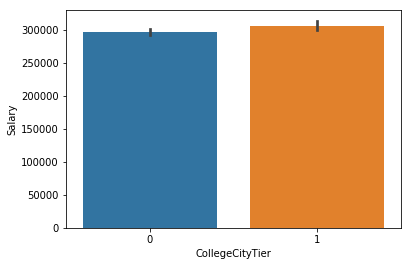

In [145]:
sns.barplot(x='CollegeCityTier',y='Salary',data=train)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 <a list of 11 Text xticklabel objects>)

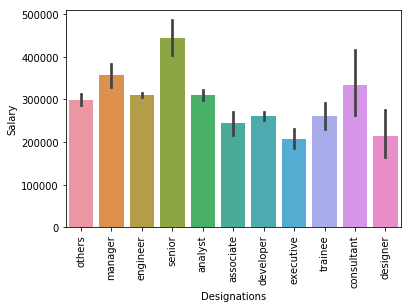

In [146]:
sns.barplot(x='Designations',y='Salary',data=train)
plt.xticks(rotation=90)

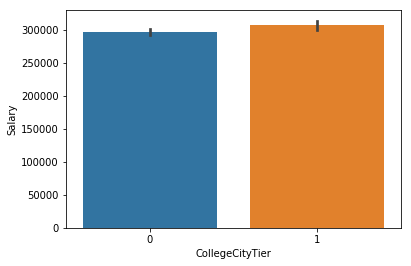

In [147]:
sns.barplot(x='CollegeCityTier',y='Salary',data=train)

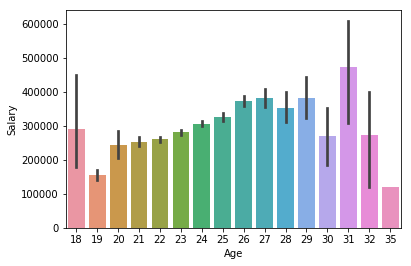

In [148]:
sns.barplot(x='Age',y='Salary',data=train)

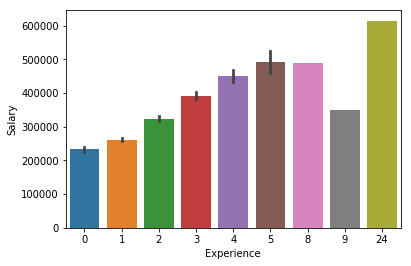

In [149]:
sns.barplot(x='Experience',y='Salary',data=train)

# Correlation Plot

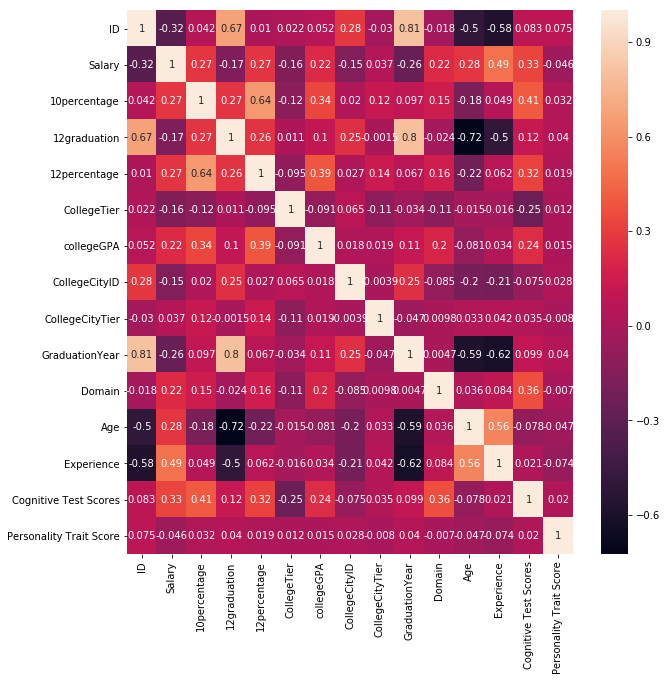

In [150]:
plt.figure(figsize=(10,10))
sns.heatmap(train.corr(),annot=True)

# Pair Plot (hist)

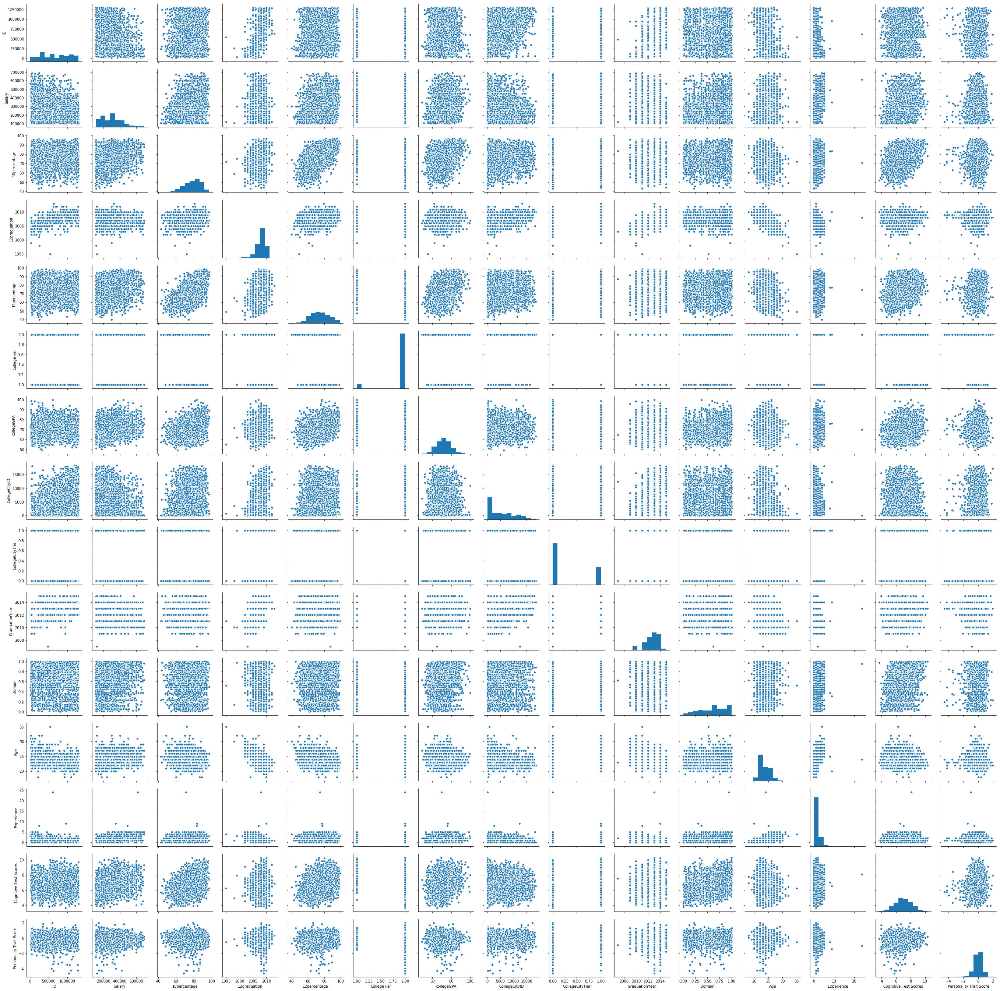

In [151]:
sns.pairplot(data = train)

# Pair Plot (Density)

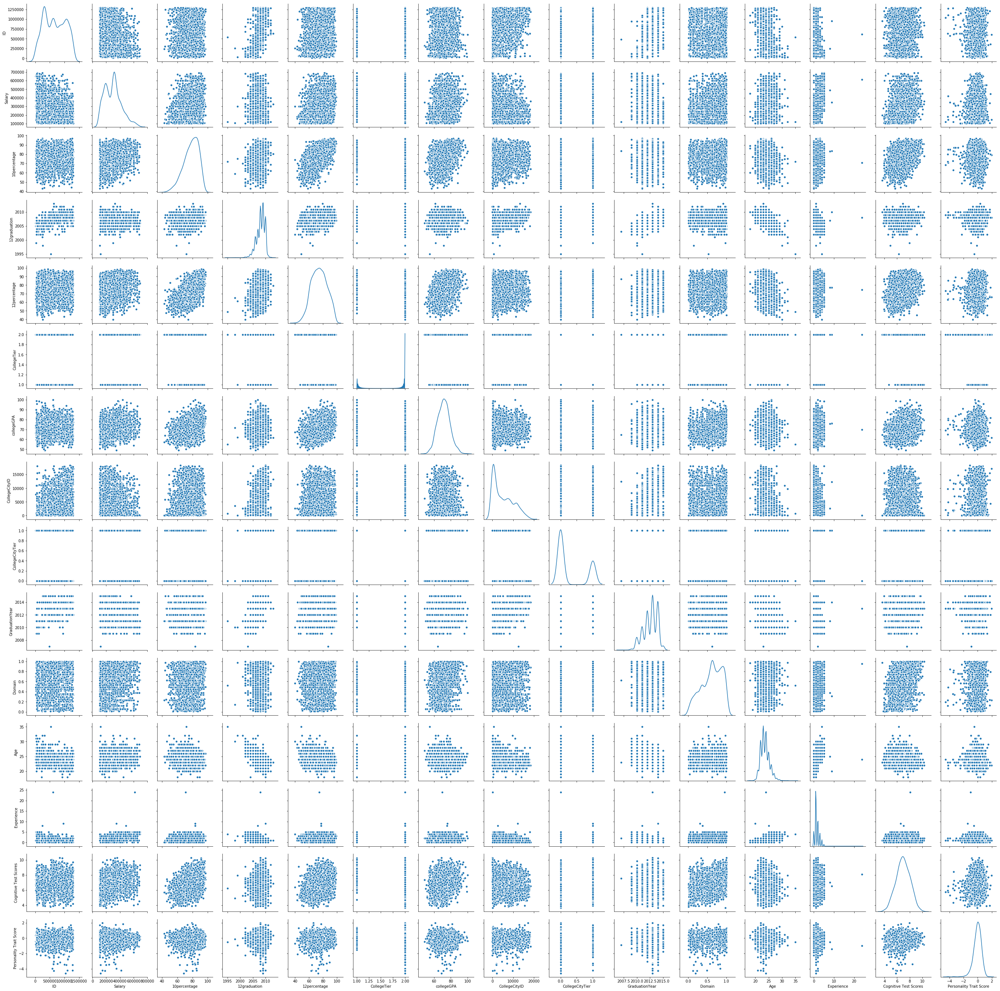

In [152]:
sns.pairplot(data = train, diag_kind='kde')

# Defining Features and Target

In [153]:
X= train[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = train['Salary']

# Train-Test Split

In [154]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.30,random_state=1)

# KBest Feature Selection

In [155]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
bestfeatures = SelectKBest(score_func=f_regression, k='all')
fit = bestfeatures.fit(x_train,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x_train.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Score'] 
print(featureScores.nlargest(10,'Score'))

                 Feature       Score
4             Experience  755.685759
5  Cognitive Test Scores  341.872714
3                    Age  218.985077
6           10percentage  196.456129
7           12percentage  191.292989
0             collegeGPA  133.382060
1            CollegeTier   82.528343
2        CollegeCityTier    2.515481


# Linear Regression

In [156]:
# Create Empty Lists to append Regression scores and errors
model_names = []
train_r2_scores = []
test_r2_scores = []
mae_values = []
mse_values = []
rmse_values = []

In [157]:
lr_mdl = LinearRegression()
lr_mdl.fit(x_train,y_train) 

y_pred = lr_mdl.predict(x_test)

train_r2 = lr_mdl.score(x_train,y_train)
test_r2  = lr_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Linear Regression")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Linear Regression ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Linear Regression ***
Train R-squared:  0.37763391877019925
Test R-squared:  0.3956646877929947
MAE:  74512.50458002368
MSE:  8974932900.869425
RMSE:  94736.12247115366


# Support Vector Regressor - RBF

In [158]:
svm_mdl = svm.SVR()
svm_mdl.fit(x_train,y_train) 

y_pred = svm_mdl.predict(x_test)

train_r2 = svm_mdl.score(x_train,y_train)
test_r2  = svm_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("SVR - RBF")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** SVR - RBF ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** SVR - RBF ***
Train R-squared:  9.761755396309191e-05
Test R-squared:  -0.0004566196489479424
MAE:  96299.404393545
MSE:  14857697126.4329
RMSE:  121892.15367050047


# Random Forest Regressor

In [159]:
rf_mdl = RandomForestRegressor(n_estimators = 1500,max_features='sqrt')
rf_mdl.fit(x_train,y_train) 

y_pred = rf_mdl.predict(x_test)

train_r2 = rf_mdl.score(x_train,y_train)
test_r2  = rf_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Random Forest Regressor")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Random Forest Regressor ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Random Forest Regressor ***
Train R-squared:  0.9133034204649685
Test R-squared:  0.3965428932272127
MAE:  73808.4226424326
MSE:  8961890745.817287
RMSE:  94667.26332696687


# Support Vector Regressor - Linear

In [160]:
svr_mdl = svm.LinearSVR()
svr_mdl.fit(x_train,y_train) 

y_pred = svr_mdl.predict(x_test)

train_r2 = svr_mdl.score(x_train,y_train)
test_r2  = svr_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Linear SVR")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Linear SVR ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Linear SVR ***
Train R-squared:  0.10610044372560967
Test R-squared:  0.12036212765224485
MAE:  89520.54359118214
MSE:  13063428070.343254
RMSE:  114295.3545440201


# Lasso

In [161]:
lasso_mdl = linear_model.Lasso(alpha=0.05, selection="random", random_state=0)
lasso_mdl.fit(x_train,y_train) 

y_pred = lasso_mdl.predict(x_test)

train_r2 = lasso_mdl.score(x_train,y_train)
test_r2  = lasso_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Lasso")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Lasso ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Lasso ***
Train R-squared:  0.3776339187663489
Test R-squared:  0.39566485734085155
MAE:  74512.49138406022
MSE:  8974930382.928463
RMSE:  94736.10918191892


# Ridge

In [162]:
from sklearn.linear_model import LinearRegression, Ridge

ridge_mdl = linear_model.Ridge(alpha=0, random_state=0)
ridge_mdl.fit(x_train,y_train) 

y_pred = ridge_mdl.predict(x_test)

train_r2 = ridge_mdl.score(x_train,y_train)
test_r2  = ridge_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Ridge")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Ridge ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Ridge ***
Train R-squared:  0.37763391877019914
Test R-squared:  0.3956646877929947
MAE:  74512.50458002367
MSE:  8974932900.869425
RMSE:  94736.12247115366


# Logistic Regression Linear model fit

In [163]:
log_mdl = linear_model.LogisticRegression()
log_mdl.fit(x_train,y_train) 

y_pred = log_mdl.predict(x_test)

train_r2 = log_mdl.score(x_train,y_train)
test_r2  = log_mdl.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Logistic Regression")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Logistic Regression ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Logistic Regression ***
Train R-squared:  0.08942457231726283
Test R-squared:  0.0942883046237534
MAE:  88943.78966455122
MSE:  13946622846.781506
RMSE:  118095.82061521697


# Decision Tree Regressor

In [164]:
from sklearn.tree import DecisionTreeRegressor
dt= DecisionTreeRegressor()
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.30,random_state=1)
dt.fit(x_train,y_train)
y_pred= dt.predict(x_test)

train_r2 = dt.score(x_train,y_train)
test_r2  = dt.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Decision Tree Regressor")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Decision Tree Regressor ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Decision Tree Regressor ***
Train R-squared:  1.0
Test R-squared:  -0.2962270326961072
MAE:  105834.08884859474
MSE:  19250158658.204895
RMSE:  138744.94101842018


# AdaBoosting Regressor

In [165]:
from sklearn.ensemble import AdaBoostRegressor
abr=AdaBoostRegressor()
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.30,random_state=1)
abr.fit(x_train,y_train)
y_pred= abr.predict(x_test)

train_r2 = abr.score(x_train,y_train)
test_r2  = abr.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("AdaBoost Regressor")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** AdaBoost Regressor ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** AdaBoost Regressor ***
Train R-squared:  0.29055316842756174
Test R-squared:  0.2677435057257944
MAE:  83204.14257795207
MSE:  10874679618.399918
RMSE:  104281.73194956017


# Gradient Boosting Regressor

In [166]:
from sklearn.ensemble import GradientBoostingRegressor
gbr=GradientBoostingRegressor()
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.30,random_state=1)
gbr.fit(x_train,y_train)
y_pred= gbr.predict(x_test)

train_r2 = gbr.score(x_train,y_train)
test_r2  = gbr.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("GradBoost Regressor")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** GradBoost Regressor ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** GradBoost Regressor ***
Train R-squared:  0.5022870659269709
Test R-squared:  0.4084079152253469
MAE:  73019.53351472279
MSE:  8785684301.895113
RMSE:  93731.98121183139


# K Nearest Neighbors Regressor

In [167]:
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt
import matplotlib.pyplot as plt
%matplotlib inline

In [168]:
from sklearn.model_selection import GridSearchCV
params = {'n_neighbors':[2,3,4,5,6,7,8,9]}

knn = neighbors.KNeighborsRegressor()

model = GridSearchCV(knn, params, cv=5)
model.fit(x_train,y_train)
model.best_params_

{'n_neighbors': 9}

In [169]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=9)
neigh.fit(X,Y) 
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.30,random_state=1)
neigh.fit(x_train,y_train)
y_pred= neigh.predict(x_test)

train_r2 = neigh.score(x_train,y_train)
test_r2  = neigh.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("KNN Regressor")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** KNN Regressor ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** KNN Regressor ***
Train R-squared:  0.3496357171560045
Test R-squared:  0.23194533320405486
MAE:  83141.63392767201
MSE:  11406315268.123974
RMSE:  106800.35237827623


# Linear Regression - Ploynomial Features

In [173]:
poly = PolynomialFeatures(degree=2)
X_poly= poly.fit_transform(X) 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X_poly,Y,test_size=0.30,random_state=1)
lin2 = LinearRegression() 
lin2.fit(x_train,y_train) 

y_pred = lin2.predict(x_test)

train_r2 = lin2.score(x_train,y_train)
test_r2  = lin2.score(x_test,y_test)
mae      = mean_absolute_error(y_test, y_pred)
mse      = mean_squared_error(y_test, y_pred)
rmse     = sqrt(mean_squared_error(y_test, y_pred))

model_names.append("Linear Regression - Polynomial Features")
train_r2_scores.append(train_r2)
test_r2_scores.append(test_r2)
mae_values.append(mae)
mse_values.append(mse)
rmse_values.append(rmse)

print("*** Linear Regression - Polynomial Features ***")
print("Train R-squared: ", train_r2)
print("Test R-squared: ", test_r2)
print("MAE: ", mae)
print("MSE: ", mse)
print("RMSE: ", rmse)

*** Linear Regression - Polynomial Features ***
Train R-squared:  0.40937158526735173
Test R-squared:  0.4082313164621121
MAE:  73381.30656623999
MSE:  8788306955.277092
RMSE:  93745.97034154103


# Comapare Scores and Errors of different Regression Models

In [174]:
reg_df = pd.DataFrame(list(zip(train_r2_scores, test_r2_scores, mae_values, mse_values, rmse_values)), 
                      index = model_names, 
                      columns =['Train_R2', 'Test_R2', 'MAE', 'MSE', 'RMSE']) 
reg_df

,Train_R2,Test_R2,MAE,MSE,RMSE
Linear Regression,0.377634,0.395665,74512.504580,8.974933e+09,94736.122471
SVR - RBF,0.000098,-0.000457,96299.404394,1.485770e+10,121892.153671
Random Forest Regressor,0.913303,0.396543,73808.422642,8.961891e+09,94667.263327
Linear SVR,0.106100,0.120362,89520.543591,1.306343e+10,114295.354544
Lasso,0.377634,0.395665,74512.491384,8.974930e+09,94736.109182
Ridge,0.377634,0.395665,74512.504580,8.974933e+09,94736.122471
Logistic Regression,0.089425,0.094288,88943.789665,1.394662e+10,118095.820615
Decision Tree Regressor,1.000000,-0.296227,105834.088849,1.925016e+10,138744.941018
AdaBoost Regressor,0.290553,0.267744,83204.142578,1.087468e+10,104281.731950
GradBoost Regressor,0.502287,0.408408,73019.533515,8.785684e+09,93731.981212


# Visualization of Best Fit

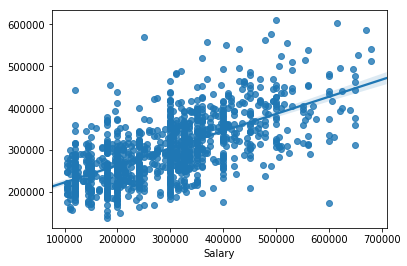

In [175]:
sns.regplot(x=y_test,y=y_pred) ## Showing the relationship between train and test data according to Linear Regression as it was the best Regression model

# Since we see that, we cant further increase efficiency of regression models, let's deal this as classification problem

# Let's try to modify this as a classification problem by creating 3 bins from salary columns

In [176]:
def sal(x):
    if x > 1000000:
        return 'High packg'
    elif x > 500000 and x <= 1000000:
        return 'Good packg'
    elif x > 350000 and x <= 500000:
        return 'Average packg'
    else:
        return 'Low packg'

In [177]:
df = train.copy()
df.head()

,ID,Salary,JobCity,Gender,10percentage,12graduation,12percentage,12board,CollegeTier,Degree,...,CollegeCityTier,GraduationYear,Domain,Age,Experience,Cognitive Test Scores,10 Board,12 Board,Personality Trait Score,Designations
0,203097,420000.0,Bangalore,f,84.30,2007,95.8,"board of intermediate education,ap",2,B.Tech/B.E.,...,0,2011,0.635979,25,3,7.487992,State Board,State Board,0.644560,others
1,579905,500000.0,Indore,m,85.40,2007,85.0,cbse,2,B.Tech/B.E.,...,0,2012,0.960603,26,2,9.452899,CBSE,CBSE,0.328220,manager
2,810601,325000.0,Chennai,f,85.00,2010,68.2,cbse,2,B.Tech/B.E.,...,0,2014,0.450877,23,1,7.074544,CBSE,CBSE,0.390060,engineer
4,343523,200000.0,Manesar,m,78.00,2008,76.8,cbse,2,B.Tech/B.E.,...,0,2012,0.124502,24,1,7.582652,CBSE,CBSE,-0.453574,others
5,1027655,300000.0,Hyderabad,m,89.92,2010,87.0,state board,2,B.Tech/B.E.,...,0,2014,0.622643,23,1,7.916635,State Board,State Board,-0.964100,engineer


In [178]:
df['Salary'] = df['Salary'].astype("float")


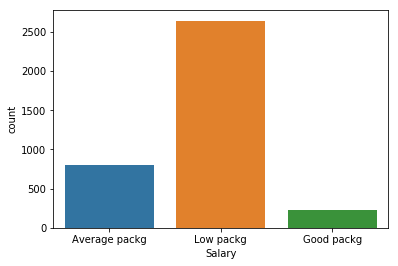

In [179]:
from sklearn.preprocessing import LabelEncoder
df['Salary'] = df['Salary'].apply(sal)
import seaborn as sns
sns.countplot(df['Salary'])

In [180]:
lc = LabelEncoder()
df['Salary'] = lc.fit_transform(df['Salary'])
df.head()

,ID,Salary,JobCity,Gender,10percentage,12graduation,12percentage,12board,CollegeTier,Degree,...,CollegeCityTier,GraduationYear,Domain,Age,Experience,Cognitive Test Scores,10 Board,12 Board,Personality Trait Score,Designations
0,203097,0,Bangalore,f,84.30,2007,95.8,"board of intermediate education,ap",2,B.Tech/B.E.,...,0,2011,0.635979,25,3,7.487992,State Board,State Board,0.644560,others
1,579905,0,Indore,m,85.40,2007,85.0,cbse,2,B.Tech/B.E.,...,0,2012,0.960603,26,2,9.452899,CBSE,CBSE,0.328220,manager
2,810601,2,Chennai,f,85.00,2010,68.2,cbse,2,B.Tech/B.E.,...,0,2014,0.450877,23,1,7.074544,CBSE,CBSE,0.390060,engineer
4,343523,2,Manesar,m,78.00,2008,76.8,cbse,2,B.Tech/B.E.,...,0,2012,0.124502,24,1,7.582652,CBSE,CBSE,-0.453574,others
5,1027655,2,Hyderabad,m,89.92,2010,87.0,state board,2,B.Tech/B.E.,...,0,2014,0.622643,23,1,7.916635,State Board,State Board,-0.964100,engineer


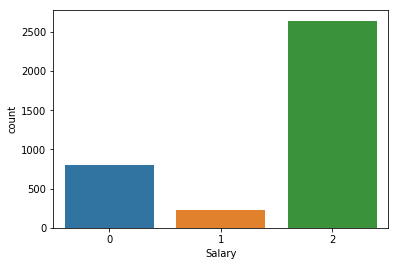

In [181]:
sns.countplot(df['Salary'])

In [182]:
classif_data_df = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage','Salary']]

# Bi-Variate Analysis (Pair plot)

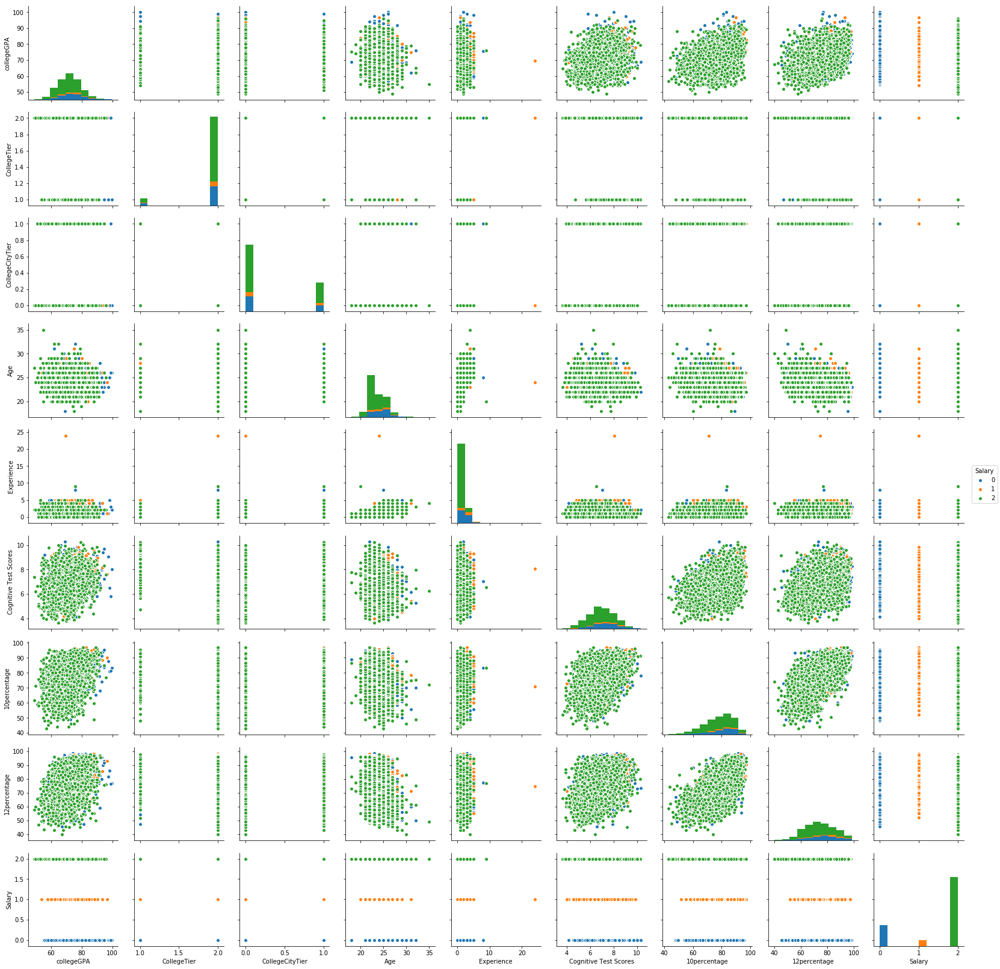

In [183]:
sns.pairplot(data=classif_data_df,  hue = 'Salary')

# Defining feature and target set

In [184]:

X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

# Train-Test Split

In [185]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size=0.30,random_state=1)

# K-Best Features (Featurization)

In [186]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif 
bestfeatures = SelectKBest(score_func=f_classif, k='all')
fit = bestfeatures.fit(x_train,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x_train.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Feature','Score'] 
print(featureScores.nlargest(10,'Score'))

                 Feature       Score
4             Experience  393.698182
3                    Age  133.547502
5  Cognitive Test Scores   70.698267
7           12percentage   48.985219
6           10percentage   39.984559
0             collegeGPA   36.752839
1            CollegeTier   20.287027
2        CollegeCityTier    0.392723


# Model Building

In [187]:
y_test.value_counts()

2    808
0    227
1     68
Name: Salary, dtype: int64

In [188]:
avg_pckg  = y_test.value_counts()[0]
good_pckg = y_test.value_counts()[1]
low_pckg  = y_test.value_counts()[2]
print("Data points with Average Package    : ", avg_pckg)
print("Data points with Good Package       : ", good_pckg)
print("Data points with Low Package        : ", low_pckg)
print("---------------------NULL ACCURACY---------------------------")
print(y_test.value_counts().head(1) / len(y_test))

Data points with Average Package    :  227
Data points with Good Package       :  68
Data points with Low Package        :  808
---------------------NULL ACCURACY---------------------------
2    0.732548
Name: Salary, dtype: float64


# Logistic Regression

In [189]:
# train a Simple logistic regression model on the training set
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(x_train, y_train)

LogisticRegression()

In [190]:
# make class predictions for the testing set
y_pred_class = logreg.predict(x_test)

In [191]:
# calculate accuracy
accuracy = []
from sklearn import metrics
accuracy.append(metrics.accuracy_score(y_test, y_pred_class))
print(metrics.accuracy_score(y_test, y_pred_class))

0.7742520398912058


In [192]:
y_test.dtype

dtype('int32')

In [193]:
## To Build Confusion Matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[ 95   1 131]
 [ 46   0  22]
 [ 48   1 759]]


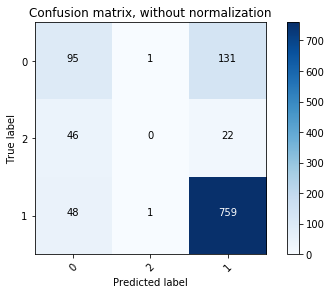

In [194]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves)

# One Vs Rest (ROC/AUC for Multiclass) - Logistic Regression

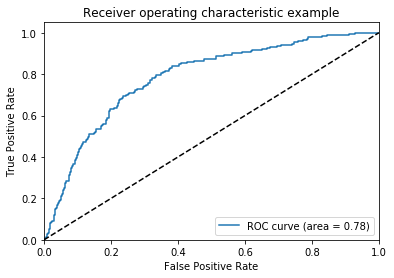

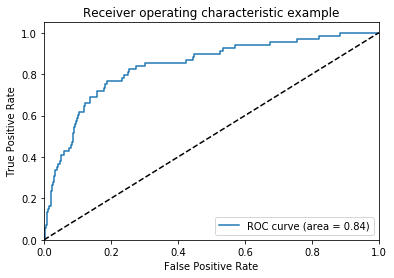

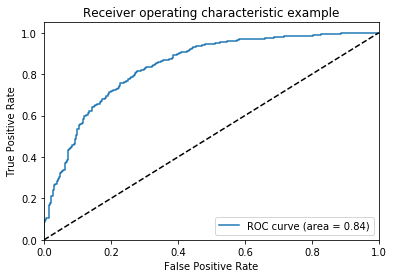

In [195]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(LogisticRegression())
y_score = clf.fit(X_train,Y_train).decision_function(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# KNN (K Nearest Neighbours)

In [196]:
from sklearn.neighbors import KNeighborsClassifier

NNH = KNeighborsClassifier()

# weights :  optional (default = ‘uniform’)
# weight function used in prediction. Possible values:
#‘uniform’ : uniform weights. All points in each neighborhood are weighted equally.
#‘distance’ : weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.

# distance measures can be P=1 manhattan, P=2 Euclidian , anyother p value will map to minkowskian

In [197]:
# Call Nearest Neighbour algorithm

NNH.fit(x_train, y_train)

KNeighborsClassifier()

In [198]:
# For every test data point, letspredict it's label based on 4 nearest neighbours in this model. T
# The majority class will be assigned to the test data point

y_pred_class = NNH.predict(x_test)

In [199]:
# calculate accuracy
from sklearn import metrics
accuracy.append(metrics.accuracy_score(y_test, y_pred_class))
print(metrics.accuracy_score(y_test, y_pred_class))

0.7361740707162284


Confusion matrix, without normalization
[[ 80   5 142]
 [ 28   5  35]
 [ 78   3 727]]


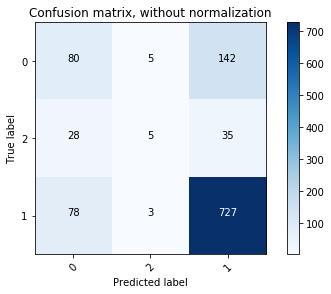

In [200]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves)

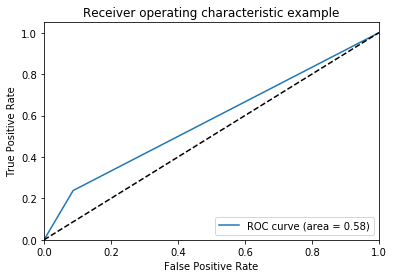

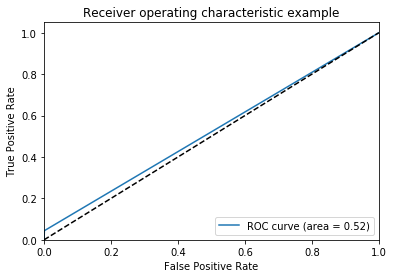

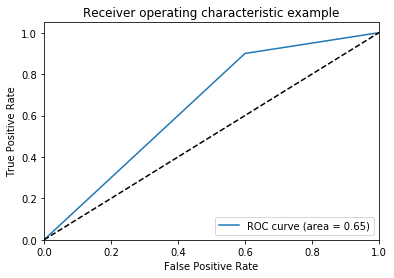

In [202]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(KNeighborsClassifier())
clf.fit(X_train, Y_train)
y_score = clf.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Naive Bayes

In [203]:
# To model the Gaussian Navie Bayes classifier
from sklearn.naive_bayes import GaussianNB

In [204]:
clf = GaussianNB()
clf.fit(x_train, y_train)

GaussianNB()

In [205]:
y_pred_class = clf.predict(x_test)

In [206]:
# calculate accuracy
from sklearn import metrics
accuracy.append(metrics.accuracy_score(y_test, y_pred_class))
print(metrics.accuracy_score(y_test, y_pred_class))

0.7452402538531279


Confusion matrix, without normalization
[[107  22  98]
 [ 35  13  20]
 [ 83  23 702]]


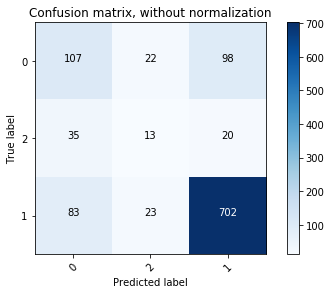

In [207]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves)

# One Vs Rest (ROC/AUC for Multiclass) - Naive Bayes

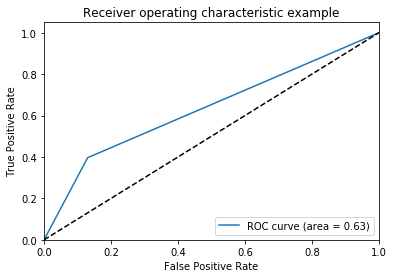

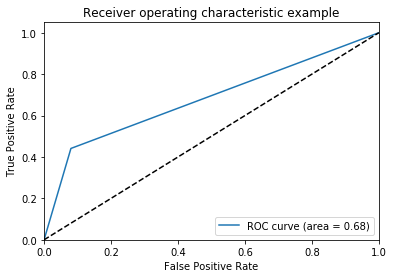

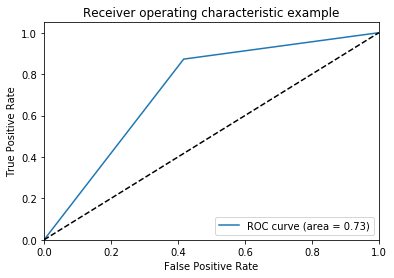

In [208]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(GaussianNB())
clf.fit(X_train, Y_train)
y_score = clf.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# SVM - Linear Model

In [209]:
# train a SVM model on the training set
from sklearn import svm
# To find the best C and Gamma hyper-parameters we need to use Grid-Search, here using some random/default params to start with
clf = svm.SVC(C=1, kernel='linear', gamma= 0.2)
clf.fit(x_train, y_train)

SVC(C=1, gamma=0.2, kernel='linear')

In [210]:
# make class predictions for the testing set
y_pred_class = clf.predict(x_test)

In [211]:
# calculate accuracy
accuracy.append(metrics.accuracy_score(y_test, y_pred_class))
print(metrics.accuracy_score(y_test, y_pred_class))

0.7987307343608341


Confusion matrix, without normalization
[[117   0 110]
 [ 45   0  23]
 [ 44   0 764]]


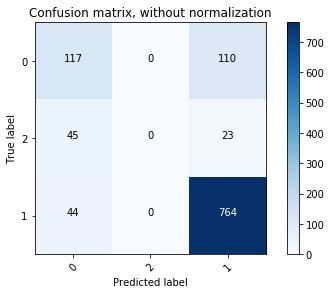

In [212]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

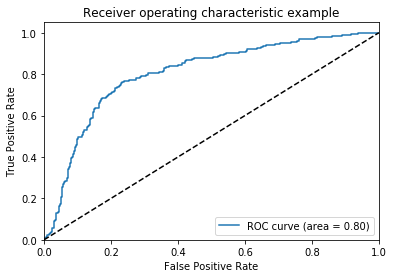

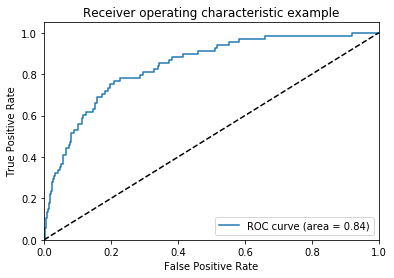

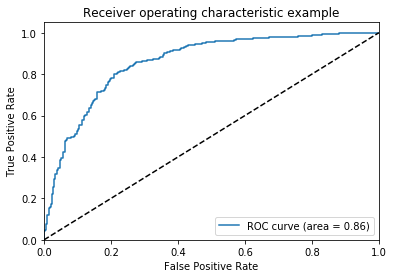

In [213]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(svm.SVC(C=1, kernel='linear', gamma= 0.2))
y_score = clf.fit(X_train,Y_train).decision_function(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# SVM - RBF Model

In [214]:
# train a SVM model on the training set
from sklearn import svm
# To find the best C and Gamma hyper-parameters we need to use Grid-Search, here using some random/default params to start with
clf = svm.SVC(C=1, kernel='rbf', gamma=0.2)
clf.fit(x_train, y_train)

SVC(C=1, gamma=0.2)

In [215]:
# make class predictions for the testing set
y_pred_class = clf.predict(x_test)

In [216]:
# calculate accuracy
accuracy.append(metrics.accuracy_score(y_test, y_pred_class))
print(metrics.accuracy_score(y_test, y_pred_class))

0.7388939256572983


Confusion matrix, without normalization
[[ 16   0 211]
 [  6   0  62]
 [  9   0 799]]


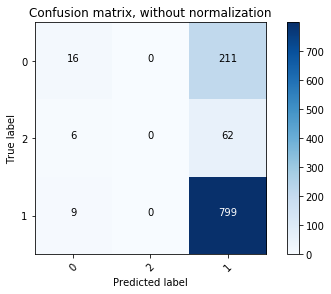

In [217]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

# One Vs Rest (ROC/AUC for Multiclass) - SVM RBF

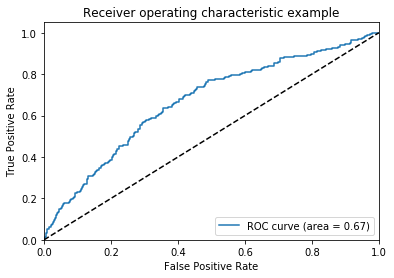

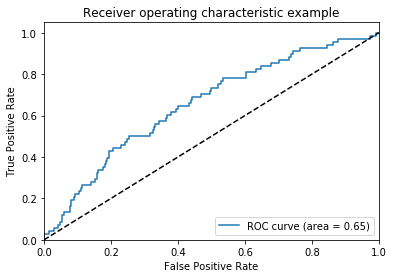

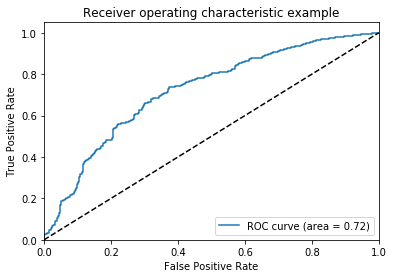

In [218]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(svm.SVC(C=1, kernel='rbf', gamma=0.2))
y_score = clf.fit(X_train,Y_train).decision_function(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Decision Trees

In [219]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(criterion = 'entropy' )
dt_model.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [220]:
y_pred_class = dt_model.predict(x_test)

In [221]:
accuracy.append(dt_model.score(x_test, y_test))
dt_model.score(x_test, y_test)

0.6826835902085222

Confusion matrix, without normalization
[[ 88  22 117]
 [ 26  16  26]
 [128  31 649]]


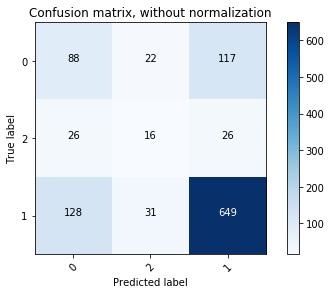

In [222]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

# One Vs Rest (ROC/AUC for Multiclass) - Decision Trees

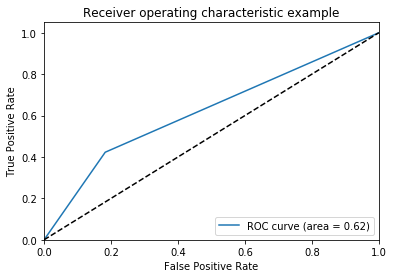

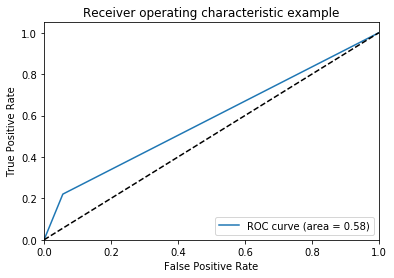

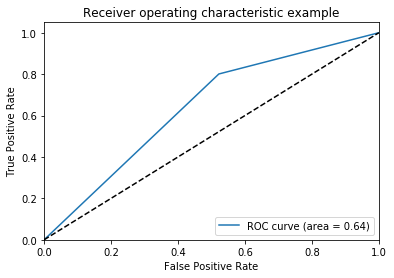

In [223]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(DecisionTreeClassifier(criterion = 'entropy' ))
clf.fit(X_train, Y_train)
y_score = clf.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Ensemble Learning - Bagging

In [224]:
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=19, max_samples=.7)
#bgcl = BaggingClassifier(n_estimators=9 , max_samples=.7)
bgcl = bgcl.fit(x_train, y_train)

In [225]:
y_pred_class = bgcl.predict(x_test)
accuracy.append(bgcl.score(x_test, y_test))
bgcl.score(x_test, y_test)

0.7615593834995467

Confusion matrix, without normalization
[[101  11 115]
 [ 36   9  23]
 [ 73   5 730]]


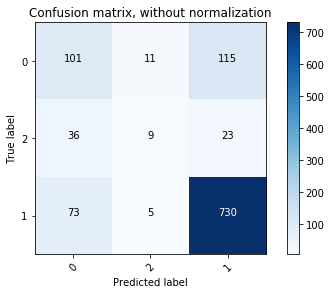

In [226]:
    # IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

# One Vs Rest (ROC/AUC for Multiclass) - Bagging

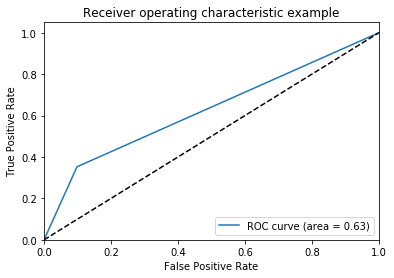

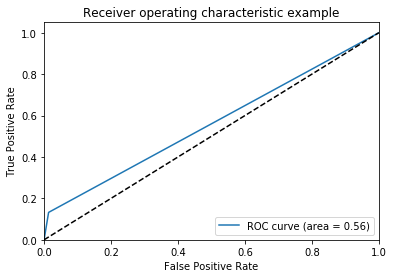

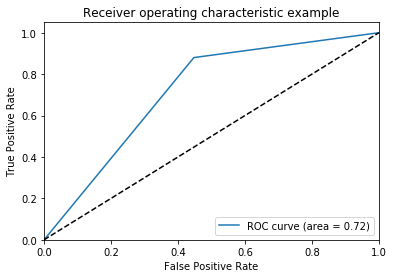

In [227]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(BaggingClassifier(base_estimator=dt_model, n_estimators=19, max_samples=.7))
clf.fit(X_train, Y_train)
y_score = clf.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Ensemble Learning - AdaBoosting

In [228]:
from sklearn.ensemble import AdaBoostClassifier
#abcl = AdaBoostClassifier(base_estimator=dt_model, n_estimators=50)
abcl = AdaBoostClassifier( n_estimators= 50)
abcl = abcl.fit(x_train, y_train)

In [229]:
from sklearn.ensemble import AdaBoostClassifier

In [230]:
y_pred_class = abcl.predict(x_test)
accuracy.append(abcl.score(x_test, y_test))
abcl.score(x_test, y_test)    

0.7805983680870353

Confusion matrix, without normalization
[[123  12  92]
 [ 33  16  19]
 [ 79   7 722]]


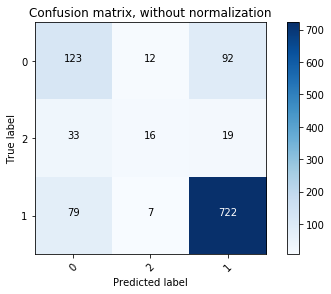

In [231]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

# One Vs Rest (ROC/AUC for Multiclass) - AdaBoost

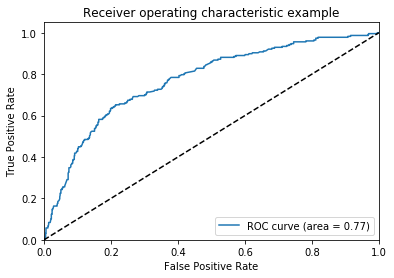

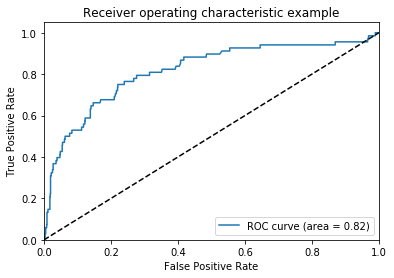

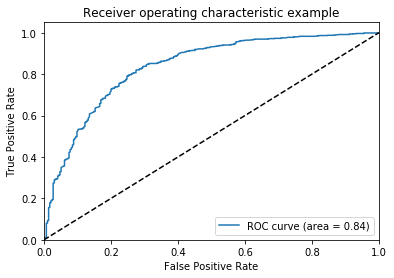

In [232]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(AdaBoostClassifier( n_estimators= 50))
y_score = clf.fit(X_train,Y_train).decision_function(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()


# Ensemble Learning - GradientBoost

In [233]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.05)
gbcl = gbcl.fit(x_train, y_train)

In [234]:
y_pred_class = gbcl.predict(x_test)
accuracy.append(gbcl.score(x_test, y_test))
gbcl.score(x_test, y_test)

0.7805983680870353

Confusion matrix, without normalization
[[105   7 115]
 [ 34   7  27]
 [ 53   6 749]]


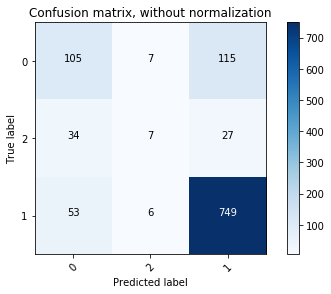

In [235]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

# One Vs Rest (ROC/AUC for Multiclass) - Gradient Boosting

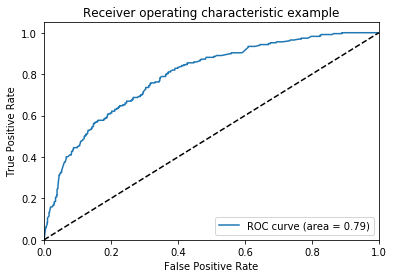

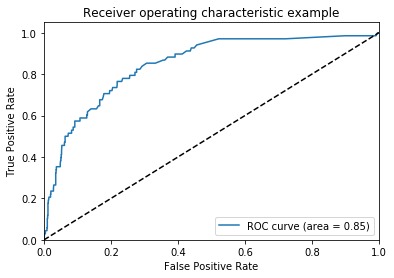

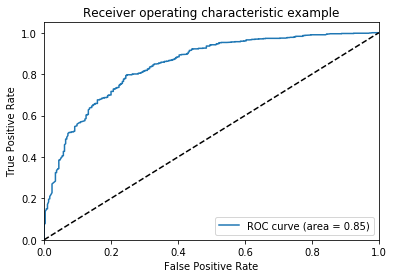

In [236]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.05))
y_score = clf.fit(X_train,Y_train).decision_function(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Ensemble RandomForest Classifier

In [237]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(x_train, y_train)

In [238]:
y_pred_class = rfcl.predict(x_test)
accuracy.append(rfcl.score(x_test, y_test))
rfcl.score(x_test, y_test)

0.7524932003626473

Confusion matrix, without normalization
[[ 99   8 120]
 [ 29   8  31]
 [ 84   1 723]]


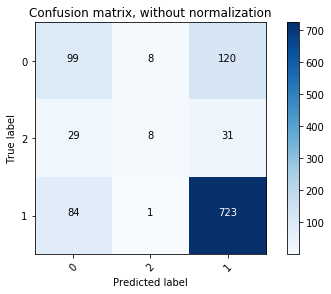

In [239]:
# IMPORTANT: first argument is true values, second argument is predicted values
import itertools
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(y_test, y_pred_class)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=pd.unique(y_train),
                      title='Confusion matrix, without normalization')

# Binarize for OneVsRest Classifier for displaying ROC and AUC Curves

# One Vs Rest (ROC/AUC for Multiclass) - Random Forest

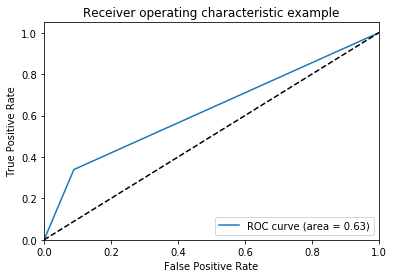

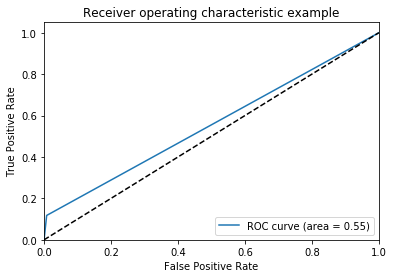

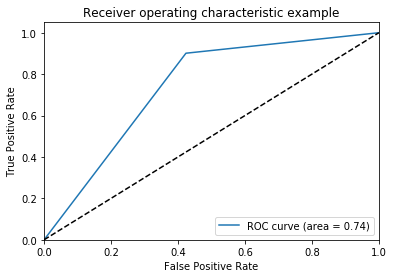

In [240]:
X = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage']]
Y = df['Salary']

from sklearn.preprocessing import label_binarize
y = label_binarize(Y, classes=[0,1,2])
n_classes = 3

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.30,random_state=1)

from sklearn.multiclass import OneVsRestClassifier

# classifier
clf = OneVsRestClassifier(RandomForestClassifier(n_estimators = 50))
clf.fit(X_train, Y_train)
y_score = clf.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Accuracy Scores Comparison for all the classification models

# Logistic", "KNN", "Naive_bayes", "SVM_Linear", "SVM_RBF", "Decision_Tree", "Bagging", "AdaBoost", "GradBoost", "Random_Forest

In [241]:
models = ["Logistic","KNN", "Naive_bayes","SVM_Linear","SVM_RBF","Decision_Tree","Bagging","AdaBoost","GradBoost","Random_Forest"]

In [242]:
def eg3_lc(keys, values):
    return { keys[i] : values[i] for i in range(len(keys)) }

In [243]:
eg3_lc(models, accuracy)

{'Logistic': 0.7742520398912058,
 'KNN': 0.7361740707162284,
 'Naive_bayes': 0.7452402538531279,
 'SVM_Linear': 0.7987307343608341,
 'SVM_RBF': 0.7388939256572983,
 'Decision_Tree': 0.6826835902085222,
 'Bagging': 0.7615593834995467,
 'AdaBoost': 0.7805983680870353,
 'GradBoost': 0.7805983680870353,
 'Random_Forest': 0.7524932003626473}

# K Fold Cross Validation

In [244]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg_scores = cross_val_score(logreg,X,Y, cv=10)
logreg_scores

array([0.77173913, 0.76902174, 0.73913043, 0.76358696, 0.75271739,
       0.75749319, 0.77384196, 0.77929155, 0.76566757, 0.77384196])

In [245]:
clf = GaussianNB()
NB_scores = cross_val_score(clf,X,Y, cv=10)
NB_scores

array([0.72554348, 0.73097826, 0.70652174, 0.73641304, 0.73913043,
       0.73841962, 0.77656676, 0.76566757, 0.71662125, 0.76839237])

In [246]:
KNNH = KNeighborsClassifier(n_neighbors= 9 , weights = 'uniform', metric='euclidean')
KNN_scores = cross_val_score(KNNH,X,Y, cv=10)
KNN_scores

array([0.70108696, 0.76086957, 0.69293478, 0.75      , 0.71467391,
       0.73569482, 0.75476839, 0.7520436 , 0.73024523, 0.76294278])

In [247]:
from sklearn import svm
svmlnr = svm.SVC(C=1, kernel='linear',gamma=0.2)
svmlnr_scores = cross_val_score(svmlnr,X,Y, cv=10)
svmlnr_scores

array([0.77173913, 0.7798913 , 0.73641304, 0.77445652, 0.75271739,
       0.78474114, 0.79564033, 0.79836512, 0.77929155, 0.79019074])

In [248]:
svmrbf = svm.SVC(C=1, kernel='rbf',gamma=0.2)
svmrbf_scores = cross_val_score(svmrbf, X,Y, cv=10)
svmrbf_scores

array([0.72282609, 0.74456522, 0.71467391, 0.74456522, 0.7201087 ,
       0.72479564, 0.72207084, 0.72752044, 0.73569482, 0.73569482])

In [249]:
dt_model = DecisionTreeClassifier(criterion = 'entropy' )
dt_scores = cross_val_score(dt_model,X,Y, cv=10)
dt_scores

array([0.70108696, 0.69836957, 0.625     , 0.66576087, 0.69565217,
       0.67847411, 0.69754768, 0.67029973, 0.62942779, 0.68119891])

In [250]:
bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=19, max_samples=.7)
bgcl_scores = cross_val_score(bgcl,X,Y, cv=10)
bgcl_scores

array([0.76358696, 0.77173913, 0.7201087 , 0.74184783, 0.75      ,
       0.73569482, 0.76839237, 0.77111717, 0.7520436 , 0.76566757])

In [251]:
abcl = AdaBoostClassifier( n_estimators= 50)
abcl_scores = cross_val_score(abcl,X,Y, cv=10)
abcl_scores

array([0.79076087, 0.75543478, 0.74184783, 0.77445652, 0.78532609,
       0.76294278, 0.77111717, 0.77384196, 0.76566757, 0.79836512])

In [252]:
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.05)
gbcl_scores = cross_val_score(gbcl,X,Y, cv=10)
gbcl_scores

array([0.79076087, 0.75815217, 0.75543478, 0.78804348, 0.76630435,
       0.77384196, 0.78474114, 0.77929155, 0.77111717, 0.78746594])

In [253]:
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl_scores = cross_val_score(rfcl,X,Y, cv=10)
rfcl_scores

array([0.77717391, 0.79076087, 0.72826087, 0.76358696, 0.76086957,
       0.75476839, 0.77656676, 0.77111717, 0.75749319, 0.77111717])

In [254]:
cross_val_scores_df = pd.DataFrame(np.hstack((logreg_scores,NB_scores,KNN_scores,svmlnr_scores,svmrbf_scores,dt_scores,bgcl_scores,abcl_scores,gbcl_scores,rfcl_scores)))

In [255]:
cross_val_scores_df['Method'] = ["Mthod"]*100
cross_val_scores_df.columns = ["Scores","Method"]
for i in range(100):
    if i < 10:
        cross_val_scores_df.loc[i,'Method'] = 'Lgt_Regrsn'
    elif (i >= 10) and (i < 20):
        cross_val_scores_df.loc[i,'Method'] = 'Naive_Bayes'
    elif (i >= 20) and (i < 30):
        cross_val_scores_df.loc[i,'Method'] = 'KNN'
    elif (i >= 30) and (i < 40):
        cross_val_scores_df.loc[i,'Method'] = 'SVM_Linear'
    elif (i >= 40) and (i < 50):
        cross_val_scores_df.loc[i,'Method'] = 'SVM_RBF'
    elif (i >= 50) and (i < 60):
        cross_val_scores_df.loc[i,'Method'] = 'Decision_Tree'
    elif (i >= 60) and (i < 70):
        cross_val_scores_df.loc[i,'Method'] = 'Bagging'
    elif (i >= 70) and (i < 80):
        cross_val_scores_df.loc[i,'Method'] = 'Ada_Boost'
    elif (i >= 80) and (i < 90):
        cross_val_scores_df.loc[i,'Method'] = 'Grad_Boost'
    elif (i >= 90) and (i < 100):\
        cross_val_scores_df.loc[i,'Method'] = 'Random_Forest'

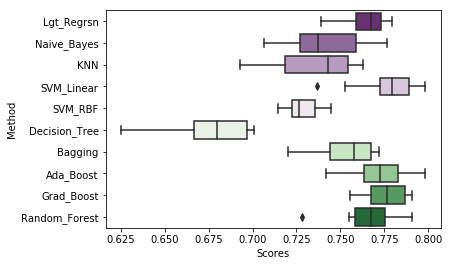

In [256]:
sns.boxplot(x="Scores", y="Method", data=cross_val_scores_df, palette="PRGn")

# Bootsrap Range Estimate for Gradient Boosting

In [257]:
data = df[['collegeGPA','CollegeTier','CollegeCityTier','Age','Experience', 'Cognitive Test Scores','10percentage','12percentage','Salary']]

In [266]:
n_iterations = 100                # Number of bootstrap samples to create
n_size = int(len(data) * 0.70)   # picking only 70 % of the given data in every bootstrap sample
print(round(n_size*0.7))

1800


In [267]:
values =  data.values

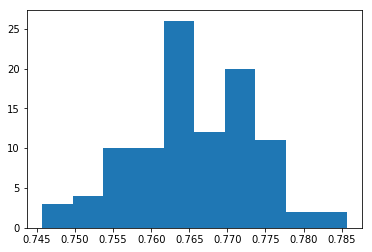

95.0 confidence interval 75.0% and 77.8%


In [268]:
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
import numpy
stats1 = list()
for i in range(n_iterations):
      
    train = resample(values, n_samples=n_size)
    test = numpy.array([x for x in values if x.tolist() not in train.tolist()])

    model = GradientBoostingClassifier()
    model.fit(train[:,:-1], train[:,-1])

    predictions = model.predict(test[:,:-1])
    score = accuracy_score(test[:,-1], predictions)    
    stats1.append(score)
    
    
from matplotlib import pyplot
pyplot.hist(stats1)
pyplot.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats1, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats1, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

# CONCLUSION:

### Apart from Ensemble Method, Logistic and SVM Linear Produced decent accuracy in 10 fold Cross Validation

### Considering Ensemble, AdaBoost and Gradient Boost showed High Accuracy Scores

### Model with the Least accuracy score is Decision tree

### Gradient Boost, SVM RBF and Ada Boost are having lesser variance with Good Accuracy Score

### We chose Gradient Boosting as final model because of,

### 1. Good Accuracy Range

### 2. No visible outliers

### 3. No drastic shift of Median

### 4. Less Variance